In [1]:
import os
import mne
import pickle as pkl
import numpy as np
import pandas as pd
import spkit as sp
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from glob import glob
from scipy.signal import welch
from mne_faster import (
    find_bad_channels,
    find_bad_epochs,
    find_bad_components,
    find_bad_channels_in_epochs,
)
from sklearn.feature_selection import mutual_info_classif

/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


### Getting paths of files

In [7]:
#Run for 10 subs data
all_files_path = glob("../data-files/*.set")

In [9]:
#Run for all subs data
all_files_path = glob("../final-dataset/*.set")

In [3]:
display(len(all_files_path))

348

In [4]:
if len(all_files_path) == 348:
  taskid = 10
elif len(all_files_path) == 120:
  taskid = 8

In [19]:
display(
  os.path.basename(all_files_path[21]),
  os.path.basename(all_files_path[21])[-9]
)

'sub-04-s1-rest.set'

'-'

In [32]:
rest_files_path = [i for i in all_files_path if os.path.basename(i)[taskid] == "r"]

In [5]:
zerob_files_path = [i for i in all_files_path if os.path.basename(i)[taskid] == "0"]

In [6]:
oneb_files_path = [i for i in all_files_path if os.path.basename(i)[taskid] == "1"]

In [33]:
twob_files_path = [i for i in all_files_path if os.path.basename(i)[taskid] == "2"]

In [34]:
display(
  len(rest_files_path),
  # len(zerob_files_path),
  # len(oneb_files_path),
  len(twob_files_path)
)

87

87

### Execute when running testing and training on one subject

In [24]:
subjectid = '01'
sub_file_paths = [i for i in all_files_path if os.path.basename(i)[4:6] == subjectid]

In [25]:
rest_files_path = [i for i in sub_file_paths if os.path.basename(i)[taskid] == "r"]

In [26]:
zerob_files_path = [i for i in sub_file_paths if os.path.basename(i)[taskid] == "0"]

In [27]:
oneb_files_path = [i for i in sub_file_paths if os.path.basename(i)[taskid] == "1"]

In [30]:
twob_files_path = [i for i in sub_file_paths if os.path.basename(i)[taskid] == "2"]

In [31]:
display(
  len(rest_files_path),
  # len(zerob_files_path),
  # len(oneb_files_path),
  len(twob_files_path)
)

3

3

### Testing

#### Extracting eeg information

In [54]:
file_path = oneb_files_path[29]

In [55]:
eeg = mne.io.read_raw_eeglab(file_path, preload=True, verbose=False)

/tmp/ipykernel_19928/2449053524.py:1: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s2-1back.fdt).
/tmp/ipykernel_19928/2449053524.py:1: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_19928/2449053524.py:1: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_19928/2449053524.py:1: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


In [56]:
eeg.drop_channels(
    ch_names=["ECG1", "Cz"], 
    on_missing="ignore"  # can be set to raise, warn or ignore
)

<RawEEGLAB | sb04-s2-1back.fdt, 62 x 162276 (324.6 s), ~76.8 MB, data loaded>

In [34]:
data, times = eeg[:]
channels = eeg.ch_names

In [35]:
display(data.shape, times.shape)

(62, 162276)

(162276,)

#### Checking eeg info

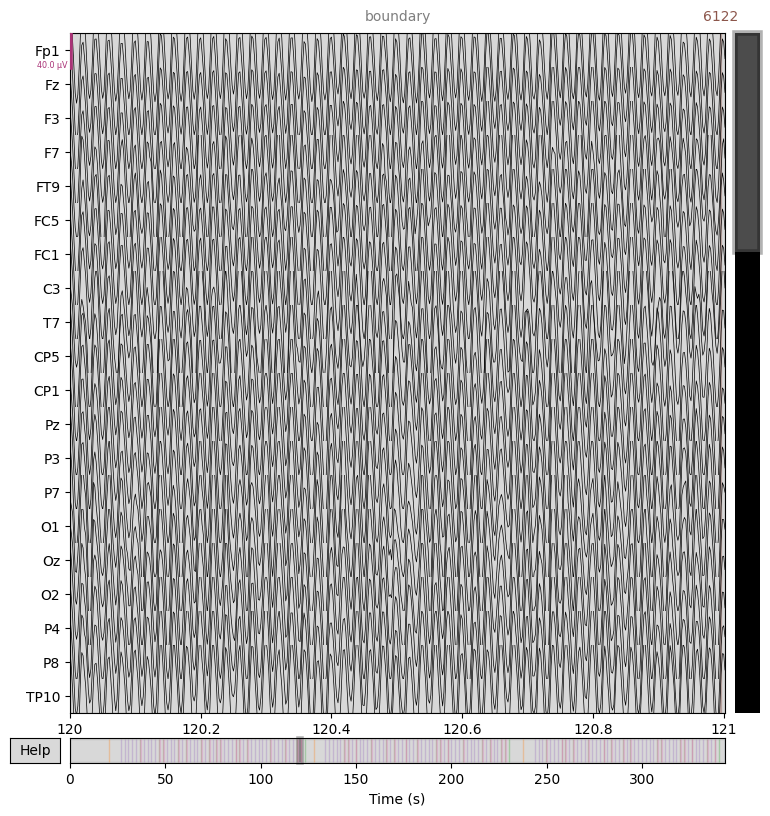

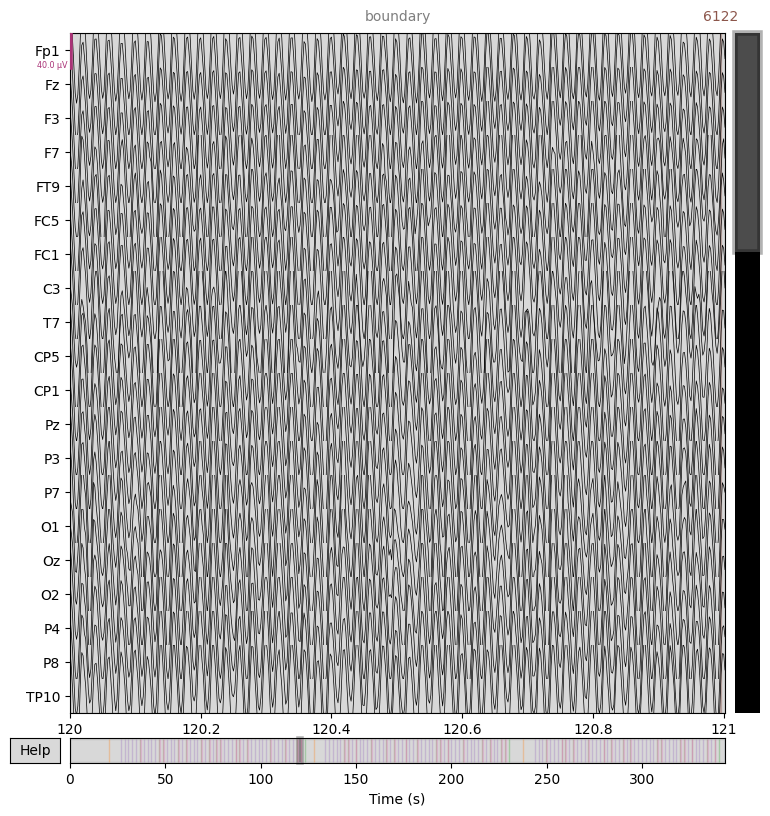

In [34]:
eeg.plot(start=120, duration=1)

In [35]:
display(eeg, type(eeg))

<RawEEGLAB | sb04-s1-1back.fdt, 62 x 171719 (343.4 s), ~81.3 MB, data loaded>

mne.io.eeglab.eeglab.RawEEGLAB

In [36]:
display(eeg.ch_names)

['Fp1',
 'Fz',
 'F3',
 'F7',
 'FT9',
 'FC5',
 'FC1',
 'C3',
 'T7',
 'CP5',
 'CP1',
 'Pz',
 'P3',
 'P7',
 'O1',
 'Oz',
 'O2',
 'P4',
 'P8',
 'TP10',
 'CP6',
 'CP2',
 'FCz',
 'C4',
 'T8',
 'FT10',
 'FC6',
 'FC2',
 'F4',
 'F8',
 'Fp2',
 'AF7',
 'AF3',
 'AFz',
 'F1',
 'F5',
 'FT7',
 'FC3',
 'C1',
 'C5',
 'TP7',
 'CP3',
 'P1',
 'P5',
 'PO7',
 'PO3',
 'POz',
 'PO4',
 'PO8',
 'P6',
 'P2',
 'CPz',
 'CP4',
 'TP8',
 'C6',
 'C2',
 'FC4',
 'FT8',
 'F6',
 'AF8',
 'AF4',
 'F2']

In [57]:
annotations = pd.DataFrame(eeg.annotations)
display(annotations['description'].value_counts(), annotations.isnull().sum(), len(eeg.annotations))

description
6121        96
6122        48
6132        48
6111         3
6112         3
boundary     1
611          1
Name: count, dtype: int64

onset            0
duration         0
description      0
orig_time      200
dtype: int64

200

In [58]:
required_events = ['6122', '6132']

filtered_annotations = annotations[annotations['description'].isin(required_events)]

display(len(filtered_annotations), filtered_annotations.isnull().sum())

96

onset           0
duration        0
description     0
orig_time      96
dtype: int64

In [59]:
# Calculate difference between 6132 and previous 6122 event 
filtered_annotations['diff'] = filtered_annotations['onset'].diff()

# Filter for rows where previous event was 6122 
filtered_annotations = filtered_annotations[filtered_annotations['description'].shift() == '6122'] 

# Calculate average of diff column 
average_response_time = filtered_annotations['diff'].mean()

display(average_response_time)

/tmp/ipykernel_19928/687236223.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0.37429166666666885

In [13]:
events, events_dict = mne.events_from_annotations(eeg)

Used Annotations descriptions: ['611', '6111', '6112', '6121', '6122', '6132', 'boundary']


In [14]:
display(len(events), events_dict, events, events.shape)

200

{'611': 1,
 '6111': 2,
 '6112': 3,
 '6121': 4,
 '6122': 5,
 '6132': 6,
 'boundary': 7}

array([[     0,      0,      7],
       [ 10286,      0,      2],
       [ 13302,      0,      4],
       [ 14306,      0,      4],
       [ 15310,      0,      4],
       [ 16314,      0,      4],
       [ 17318,      0,      4],
       [ 18322,      0,      5],
       [ 18518,      0,      6],
       [ 19326,      0,      4],
       [ 20331,      0,      4],
       [ 21335,      0,      4],
       [ 22339,      0,      4],
       [ 23343,      0,      5],
       [ 23525,      0,      6],
       [ 24347,      0,      5],
       [ 24525,      0,      6],
       [ 25351,      0,      4],
       [ 26356,      0,      4],
       [ 27360,      0,      4],
       [ 28364,      0,      5],
       [ 28541,      0,      6],
       [ 29368,      0,      4],
       [ 30373,      0,      5],
       [ 30581,      0,      6],
       [ 31376,      0,      4],
       [ 32381,      0,      4],
       [ 33385,      0,      4],
       [ 34389,      0,      5],
       [ 34557,      0,      6],
       [ 3

(200, 3)

In [15]:
display(eeg.info, eeg.n_times, eeg.times)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, CP5, CP1, Pz, P3, P7, ...
 chs: 62 EEG
 custom_ref_applied: False
 dig: 66 items (3 Cardinal, 63 EEG)
 highpass: 0.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 62
 projs: []
 sfreq: 500.0 Hz
>

171719

array([0.00000e+00, 2.00000e-03, 4.00000e-03, ..., 3.43432e+02,
       3.43434e+02, 3.43436e+02])

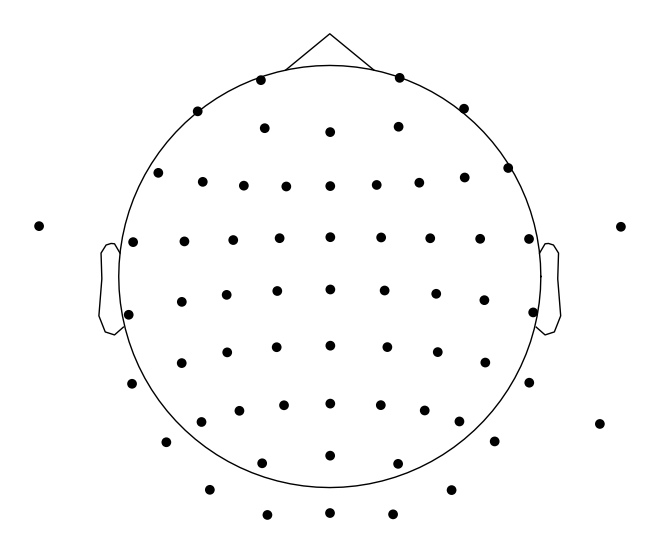

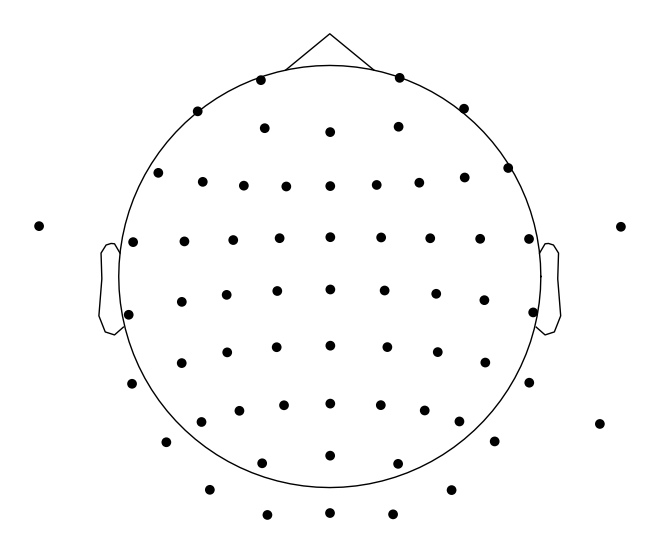

In [17]:
eeg.plot_sensors()

#### Preprocessing data of single subject

##### Resampling Data from Fs = 500Hz to Fs = 128Hz

In [50]:
eegRs = eeg.copy().resample(sfreq=128)

In [51]:
display(eeg.info["sfreq"], eegRs.info["sfreq"])

500.0

128.0

##### Filtering the data

In [60]:
# Uncomment only when resampling the data
# eegF = eegRs.copy().filter(l_freq=1, h_freq=None)

# Uncomment when not resampling the data
eegF = eeg.copy().filter(
    l_freq=1,
    h_freq=None,
    n_jobs=4,
    verbose=False,
)

eegF = eegF.notch_filter(
    freqs=50,
    verbose=False,
)
display(eegF.info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, CP5, CP1, Pz, P3, P7, ...
 chs: 62 EEG
 custom_ref_applied: False
 dig: 66 items (3 Cardinal, 63 EEG)
 highpass: 1.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 62
 projs: []
 sfreq: 500.0 Hz
>

In [61]:
data_filtered, timesF = eegF[:]
display(data_filtered.shape)

(62, 162276)

##### Artifact Removal

###### Using spkit module (ATAR and ICA)

In [101]:
# data_cleaned = sp.eeg.ATAR(
#     X=data_filtered.T,
#     beta=0.8,
#     OptMode='elim',
#     verbose=0,
#     k1= 10,
#     k2= 200,
# )
data_cleaned = sp.eeg.ICA_filtering(
    X=data_filtered.T.copy(),
    verbose=1,
    kur_thr=3.5,
    corr_thr=0.95,
    winsize=128,
)
display(data_cleaned.shape)

(43960, 63)

In [102]:
data_cleaned = data_cleaned.T
display(data_cleaned.shape)

(63, 43960)

###### Using FASTER (works on epochs)

In [17]:
included_events = ["6121", "6122"]

# include only the specified events in the annotations
include_annots = included_events
include_mask = [annot in include_annots for annot in eegF.annotations.description]
included_annotations = mne.Annotations(
    onset=eegF.annotations.onset[include_mask],
    duration=eegF.annotations.duration[include_mask],
    description=eegF.annotations.description[include_mask],
)
eegF.set_annotations(included_annotations)

# setting default eeg reference
eegF, _ = mne.io.set_eeg_reference(eegF, ref_channels=[], copy=False, verbose=False)

# extract events from the annotations and exclude any events not considered for epoching
events, events_id = mne.events_from_annotations(
    raw=eegF,
    event_id=None,
    verbose=False,
)
events = events[events[:, 2] <= len(include_annots)]
event_id = {include_annots[i]: i + 1 for i in range(len(include_annots))}

# specify the time window for the epochs
tmin, tmax = -0.05, 0.95

epochsF = mne.Epochs(
    raw=eegF,
    events=events,
    event_id=event_id,
    tmin=tmin,
    tmax=tmax,
    baseline=(None, 0),
    preload=True,
    verbose=False,
)
epochsF_bfr = epochsF.copy()
evokedF = epochsF_bfr.average()

In [18]:
display(epochsF_bfr.get_data().shape)

(144, 62, 501)

In [19]:
# Clean the data using FASTER

# Step 1: mark bad channels
epochsF.info["bads"] = find_bad_channels(epochsF, eeg_ref_corr=False)
if len(epochsF.info["bads"]) > 0:
    epochsF.interpolate_bads()

# Step 2: mark bad epochs
bad_epochs = find_bad_epochs(epochsF)
if len(bad_epochs) > 0:
    epochsF.drop(bad_epochs)

# Step 3: mark bad ICA components (using the build-in MNE functionality for this)
ica = mne.preprocessing.ICA(0.99).fit(epochsF)
ica.exclude = find_bad_components(
    ica,
    epochsF,
    use_metrics=["kurtosis", "power_gradient", "hurst", "median_gradient"],
)
ica.apply(epochsF)
# Need to re-baseline data after ICA transformation
epochsF.apply_baseline(epochsF.baseline)

# Step 4: mark bad channels for each epoch and interpolate them.
bad_channels_per_epoch = find_bad_channels_in_epochs(epochsF, eeg_ref_corr=False)
for i, b in enumerate(bad_channels_per_epoch):
    if len(b) > 0:
        ep = epochsF[i]
        ep.info["bads"] = b
        ep.interpolate_bads()
        epochsF._data[i, :, :] = ep._data[0, :, :]

Bad channel detection on EEG channels:
	Bad by variance: ['FT9']
	Bad by correlation: ['Fp2', 'AF8']
	Bad by hurst: []
	Bad by kurtosis: ['AF4']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 19 140]
	Bad by deviation: [6]
	Bad by variance: [ 19 140]
Dropped 3 epochs: 6, 19, 140
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_9027/2634656732.py:14: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 20 components
Fitting ICA took 1.9s.
Bad by kurtosis:
	[]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 1 ICA component
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['O1']
Epoch 1, Bad by amplitude:
	['O1']
Epoch 2, Bad by amplitude:
	['FT7']
Epoch 3, Bad by amplitude:
	['O1']
Epoch 4, Bad by amplitude:
	['O1']
Epoch 5, Bad by amplitude:
	['FT7']
Epoch 8, Bad by amplitude:
	['O1', 'Oz']
Epoch 10, Bad by amplitude:
	['O1', 'FT7']
Epoch 11, Bad by amplitude:
	['FT7']
Epoch 13, Bad by amplitude:
	['FT10', 'FT8']
Epoch 17, Bad by amplitude:
	['FT7']
Epoch 18, Bad by amplitude:
	['FT7']
Epoch 19, Bad by amplitude:
	['O1']
Epoch 25, Bad by amplitude:
	['O1']
Epoch 31, Bad by amplitude:
	['FT8']
Epoch 32, Bad by amplitude:
	[

/tmp/ipykernel_9027/2634656732.py:20: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 51, Bad by amplitude:
	['O1']
Epoch 52, Bad by amplitude:
	['O1', 'FT7']
Epoch 53, Bad by amplitude:
	['FT7']
Epoch 54, Bad by amplitude:
	['O1']
Epoch 56, Bad by amplitude:
	['O1']
Epoch 58, Bad by amplitude:
	['FT7']
Epoch 59, Bad by amplitude:
	['O1']
Epoch 60, Bad by amplitude:
	['FT9', 'FT7']
Epoch 62, Bad by amplitude:
	['O1', 'FT7']
Epoch 63, Bad by amplitude:
	['FT7']
Epoch 64, Bad by amplitude:
	['O1', 'FT7']
Epoch 65, Bad by amplitude:
	['O1']
Epoch 66, Bad by amplitude:
	['FT9', 'FT7']
Epoch 68, Bad by amplitude:
	['FT9', 'FT7']
Epoch 69, Bad by amplitude:
	['O1']
Epoch 70, Bad by amplitude:
	['O1']
Epoch 72, Bad by amplitude:
	['O1']
Epoch 73, Bad by amplitude:
	['O1']
Epoch 74, Bad by amplitude:
	['O1']
Epoch 75, Bad by amplitude:
	['O1']
Epoch 76, Bad by amplitude:
	['O1']
Epoch 77, Bad by amplitude:
	['O1']
Epoch 78, Bad by amplitude:
	['O1']
Epoch 79, Bad by amplitude:
	['O1']
Epoch 81, Bad by amplitude:
	['FT7']
Epoch 82, Bad by amplitude:
	['O1']
Epoch 84, Bad b

In [20]:
epochsC = epochsF.copy()
data_cleaned = epochsC.get_data()
display(data_cleaned.shape)

(141, 62, 501)

In [21]:
evokedC = epochsC.average()

In [ ]:
evokedF.plot()
evokedC.plot()

#### Plotting channels

In [29]:
# create the trace for the data
trace = go.Scatter(x=times, y=data_norm[channel], mode="lines")

# create a list of shapes for the annotations
shapes = []
for index, evt in annotations.iterrows():
    if evt["description"] == "6121":
        shapes.append(
            dict(
                type="line",
                x0=evt["onset"],
                x1=evt["onset"],
                y0=0,
                y1=1,
                xref="x",
                yref="paper",
                line=dict(color="red", width=2, dash="dash"),
            )
        )
        # shapes.append(
        #     dict(
        #         type='text',
        #         x=evt['onset'], y=data_norm[channel].max(),
        #         xref='x', yref='y',
        #         text=evt['description'],
        #         showarrow=False,
        #         font=dict(size=12, color='red')
        #     )
        # )

# create the layout with the shapes
layout = go.Layout(
    title=channels[channel],
    xaxis=dict(title="Time"),
    yaxis=dict(title="Amplitude"),
    shapes=shapes,
)

# create the figure object and plot it
fig = go.Figure(data=[trace], layout=layout)
fig.show()

### Data Preprocessing

In [27]:
#Start Code Execution Here

In [32]:
def read_filter(filepath):
    # reading data from set file
    raw = mne.io.read_raw_eeglab(filepath, preload=True, verbose=False)

    # dropping ecg1 and cz channels as cz is not present in all samples
    raw.drop_channels(
        ch_names=["ECG1", "Cz"],
        on_missing="ignore",  # can be set to raise, warn or ignore
    )

    # applying high pass filter with threshold 1hz
    raw = raw.filter(
        l_freq=1,
        h_freq=None,
        n_jobs=4,
        verbose=False,
    )

    # notch filtering with threshold 50hz
    raw = raw.notch_filter(
        freqs=50,
        verbose=False,
    )

    return raw

In [33]:
def get_epochs(raw, task):
  if task == "r":
    epochs = mne.make_fixed_length_epochs(
      raw=raw,
      duration=1,
      preload=True,
      overlap=0.59,
      verbose=False,
    )

  else:
      include_annots = [f"6{task}21", f"6{task}22"]

      # include only the specified events in the annotations
      include_mask = [
          annot in include_annots for annot in raw.annotations.description
      ]

      included_annotations = mne.Annotations(
          onset=raw.annotations.onset[include_mask],
          duration=raw.annotations.duration[include_mask],
          description=raw.annotations.description[include_mask],
      )
      raw.set_annotations(included_annotations)

      # setting default eeg reference
      raw, _ = mne.io.set_eeg_reference(
          raw, ref_channels=[], copy=False, verbose=False
      )

      # extract events from the annotations and exclude any events not considered for epoching
      events, events_id = mne.events_from_annotations(
          raw=raw,
          event_id=None,
          verbose=False,
      )
      events = events[events[:, 2] <= len(include_annots)]
      event_id = {include_annots[i]: i + 1 for i in range(len(include_annots))}

      # specify the time window for the epochs
      tmin, tmax = -0.05, 0.95

      epochs = mne.Epochs(
          raw=raw,
          events=events,
          event_id=event_id,
          tmin=tmin,
          tmax=tmax,
          baseline=(None, 0),
          preload=True,
          verbose=False,
      )

  return epochs

In [34]:
def faster_artifact_correction(epochs):
    # Clean the data using FASTER

    # Step 1: mark bad channels
    epochs.info["bads"] = find_bad_channels(
        epochs=epochs,
        eeg_ref_corr=False,
    )
    if len(epochs.info["bads"]) > 0:
        epochs.interpolate_bads()

    # Step 2: mark bad epochs
    bad_epochs = find_bad_epochs(
        epochs=epochs,
    )
    if len(bad_epochs) > 0:
        epochs.drop(bad_epochs)

    # Step 3: mark bad ICA components (using the build-in MNE functionality for this)
    ica = mne.preprocessing.ICA(0.99999999).fit(epochs)
    ica.exclude = find_bad_components(
        ica,
        epochs,
        use_metrics=["kurtosis", "power_gradient", "hurst", "median_gradient"],
    )
    ica.apply(epochs)
    # Need to re-baseline data after ICA transformation
    epochs.apply_baseline(epochs.baseline)

    # Step 4: mark bad channels for each epoch and interpolate them.
    bad_channels_per_epoch = find_bad_channels_in_epochs(
        epochs=epochs,
        eeg_ref_corr=False,
    )
    for i, b in enumerate(bad_channels_per_epoch):
        if len(b) > 0:
            ep = epochs[i]
            ep.info["bads"] = b
            ep.interpolate_bads()
            epochs._data[i, :, :] = ep._data[0, :, :]

    return epochs

In [35]:
def pipeline(path, task):
  eeg = read_filter(
      filepath=path,
  )

  epochs = get_epochs(
      raw=eeg.copy(),
      task=task,
  )

  cleaned_epochs = faster_artifact_correction(
      epochs=epochs.copy(),
  )

  return cleaned_epochs

In [36]:
# list of length len(rest_files_path) with each object being an epoch.get_data().shape = [~144, 62, 500]
rest_epochs = [pipeline(rest_file, 'r') for rest_file in rest_files_path]

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (RS_Beg_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s3-rest.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy 

Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7', 'PO8']
	Bad by kurtosis: ['FT9']
	Bad by line_noise: ['O2', 'PO4', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 55 sensor positions
Interpolating 7 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [122 123 124]
	Bad by deviation: [121 122 123 125]
	Bad by variance: [122 123 124]
Dropped 5 epochs: 121, 122, 123, 124, 125
Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by explained variance: 55 components
Fitting ICA took 60.7s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[ 7 46]
Bad by power_gradient:
	[1]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (55 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
No baseline correction applied
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['Oz', 'O2']
Epoch 1, Bad by amplitude:
	['Oz', 'O2']
Epoch 2, Bad by amplitude:
	['Oz', 'O2']
Epoch 3, Bad by amplitude:
	['Oz', 'O2']
Epoch 4, Bad by amplitude:
	['Oz']
Epoch 8, Bad by amplitude:
	['Oz']
Epoch 9, Bad by amplitude:
	['Oz']
Epoch 15, Bad by amplitude:
	['Oz']
Epoch 19, Bad by amplitude:
	['Oz']
Epoch 24, Bad by amplitude:
	['Oz']
Epoch 25, Bad by amplitude:
	['Oz']
Epoch 29, Bad by amplitude:
	['Oz']
Epoch 33, Bad by amplitude:
	['Oz']
Epoch 35, Bad by amplitude:
	['Oz']
Epoch 38, Bad by amplitude:
	['O1', 'Oz']
Epoch 39, Bad by amplitude:
	['Oz']
Epoch 44, Bad by amplitude:
	['Oz', 'O2']
Epoch 45, Bad by amplitud

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (RS_Beg_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s2-rest.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp2']
	Bad by hurst: ['Oz']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['Oz', 'O2', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [0]
	Bad by deviation: [0]
	Bad by variance: [0]
Dropped 1 epoch: 0
Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by explained variance: 57 components
Fitting ICA took 70.9s.
Bad by kurtosis:
	[19 27 32]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[37]
Bad by hurst:
	[ 0 19 27]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 5 ICA components
    Projecting back using 62 PCA components
No baseline correction applied
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['AF8']
Epoch 1, Bad by deviation:
	['F5']
Epoch 3, Bad by deviation:
	['F5']
Epoch 4, Bad by deviation:
	['F5']
Epoch 11, Bad by deviation:
	['AF8']
Epoch 13, Bad by deviation:
	['AF7']
Epoch 18, Bad by deviation:
	['AF7']
Epoch 25, Bad by deviation:
	['TP7']
Epoch 31, Bad by deviation:
	['P5']
Epoch 35, Bad by deviation:
	['AF4']
Epoch 61, Bad by deviation:
	['AF7']
Epoch 65, Bad by deviation:
	['F5']
Epoch 88, Bad by deviation:
	['AF7']
Epoch 91, Bad by deviation:
	['AF7']
Epoch 127, Bad by deviation:
	['AF4']
Epoch 128, Bad by deviation:
	['PO7']
Epoch 133, Bad by deviation:
	['AF7']
Bad channel

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (RS_Beg_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s1-rest.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['AFz']
	Bad by correlation: ['AFz']
	Bad by hurst: ['O1', 'Oz']
	Bad by kurtosis: []
	Bad by line_noise: ['O2', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [143]
	Bad by deviation: [ 0 30 33]
	Bad by variance: [89]
Dropped 5 epochs: 0, 30, 33, 89, 143
Fitting ICA to data using 62 channels (please be patient, this may take a while)
Selecting by explained variance: 57 components
Fitting ICA took 59.9s.
Bad by kurtosis:
	[47 49]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[48]
Bad by hurst:
	[ 0 49]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
No baseline correction applied
Bad channel-in-epoch detection on EEG channels:
Epoch 5, Bad by amplitude:
	['PO4']
Epoch 6, Bad by amplitude:
	['PO4']
Epoch 35, Bad by amplitude:
	['PO4']
Epoch 78, Bad by amplitude:
	['PO4']
Epoch 129, Bad by amplitude:
	['PO4']
Epoch 130, Bad by amplitude:
	['PO4']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['AF7']
Epoch 4, Bad by deviation:
	['FT9']
Epoch 20, Bad by deviation:
	['AF8']
Epoch 31, Bad by deviation:
	['FT9']
Epoch 44, Bad by deviation:
	['AF8']
Epoch 52, Bad by deviation:
	['Fz']
Epoch 77, Bad by deviation:
	['Fz']
Epoch 109, Bad by deviation:
	['AF8']
Epoch 112, Bad by deviation:
	['F1']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by variance:
	['PO4']
Ep

In [33]:
# list of length len(zerob_files_path) with each object being an epoch.get_data().shape = [~144, 62, 501]
zerob_epochs = [pipeline(zerob_file, 0) for zerob_file in zerob_files_path]

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb03-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7', 'T8']
	Bad by kurtosis: ['Fp2']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [ 88 113]
	Bad by variance: [88]
Dropped 2 epochs: 88, 113
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 65.8s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[21]
Bad by power_gradient:
	[0 1]
Bad by hurst:
	[22]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['O1', 'PO7']
Epoch 11, Bad by amplitude:
	['PO7']
Epoch 22, Bad by amplitude:
	['O1', 'PO7']
Epoch 39, Bad by amplitude:
	['O1', 'PO7']
Epoch 40, Bad by amplitude:
	['O1', 'PO7']
Epoch 44, Bad by amplitude:
	['O1', 'PO7']
Epoch 48, Bad by amplitude:
	['O1']
Epoch 53, Bad by amplitude:
	['O1', 'PO7']
Epoch 58, Bad by amplitude:
	['O1', 'PO7']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 59, Bad by amplitude:
	['O1', 'PO7']
Epoch 62, Bad by amplitude:
	['O1', 'PO7']
Epoch 63, Bad by amplitude:
	['O1', 'PO7']
Epoch 64, Bad by amplitude:
	['O1', 'PO7']
Epoch 65, Bad by amplitude:
	['O1']
Epoch 68, Bad by amplitude:
	['O1', 'PO7']
Epoch 69, Bad by amplitude:
	['PO7']
Epoch 75, Bad by amplitude:
	['O1']
Epoch 78, Bad by amplitude:
	['O1', 'PO7']
Epoch 83, Bad by amplitude:
	['O1', 'PO7']
Epoch 86, Bad by amplitude:
	['O1', 'PO7']
Epoch 89, Bad by amplitude:
	['O1', 'PO7']
Epoch 91, Bad by amplitude:
	['O1', 'PO7']
Epoch 92, Bad by amplitude:
	['O1', 'PO7']
Epoch 100, Bad by amplitude:
	['O1', 'PO7']
Epoch 104, Bad by amplitude:
	['O1', 'PO7']
Epoch 105, Bad by amplitude:
	['PO7']
Epoch 106, Bad by amplitude:
	['O1', 'PO7']
Epoch 109, Bad by amplitude:
	['O1']
Epoch 113, Bad by amplitude:
	['O1', 'PO7']
Epoch 117, Bad by amplitude:
	['O1', 'PO7']
Epoch 126, Bad by amplitude:
	['O1', 'PO7']
Epoch 130, Bad by amplitude:
	['O1', 'PO7']
Epoch 132, Bad by amplitude:
	['O1'

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb01-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp2', 'AF7', 'AF8']
	Bad by line_noise: []
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [16]
	Bad by deviation: [138 140]
	Bad by variance: []
Dropped 3 epochs: 16, 138, 140
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 35.8s.
Bad by kurtosis:
	[24 43]
Bad by power_gradient:
	[0 1]
Bad by hurst:
	[36]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 5 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['FC3']
Epoch 3, Bad by amplitude:
	['FC3']
Epoch 4, Bad by amplitude:
	['FC3']
Epoch 5, Bad by amplitude:
	['FC3']
Epoch 6, Bad by amplitude:
	['FC3']
Epoch 7, Bad by amplitude:
	['FC3']
Epoch 8, Bad by amplitude:
	['FC3']
Epoch 9, Bad by amplitude:
	['FC3']
Epoch 10, Bad by amplitude:
	['FC5', 'FT7']
Epoch 11, Bad by amplitude:
	['FC3']
Epoch 12, Bad by amplitude:
	['FT7', 'FC3']
Epoch 13, Bad by amplitude:
	['FC3']
Epoch 15, Bad by amplitude:
	['FC5', 'FT7', 'FC3']
Epoch 16, Bad by amplitude:
	['FC3']
Epoch 17, Bad by amplitude:
	['FC3']
Epoch

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 28, Bad by amplitude:
	['FT9']
Epoch 36, Bad by amplitude:
	['FC5', 'FT7']
Epoch 39, Bad by amplitude:
	['FC5', 'FT7']
Epoch 48, Bad by amplitude:
	['FC4']
Epoch 50, Bad by amplitude:
	['FC3']
Epoch 52, Bad by amplitude:
	['FT7']
Epoch 55, Bad by amplitude:
	['FC3']
Epoch 65, Bad by amplitude:
	['FC5', 'FT7']
Epoch 72, Bad by amplitude:
	['FC3']
Epoch 76, Bad by amplitude:
	['FC3']
Epoch 77, Bad by amplitude:
	['FT9']
Epoch 78, Bad by amplitude:
	['FC5', 'FT7']
Epoch 84, Bad by amplitude:
	['FC3']
Epoch 85, Bad by amplitude:
	['FT9']
Epoch 89, Bad by amplitude:
	['FT9']
Epoch 92, Bad by amplitude:
	['FC5', 'FT7']
Epoch 95, Bad by amplitude:
	['FT9']
Epoch 97, Bad by amplitude:
	['FC3']
Epoch 102, Bad by amplitude:
	['FC5', 'FT7', 'FC3']
Epoch 103, Bad by amplitude:
	['FT9']
Epoch 105, Bad by amplitude:
	['FC5', 'FC3']
Epoch 106, Bad by amplitude:
	['FC5', 'FT7', 'FC3']
Epoch 114, Bad by amplitude:
	['FT9']
Epoch 117, Bad by amplitude:
	['FT9']
Epoch 127, Bad by amplitude:
	['O1',

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb02-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2', 'AF4']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['Fp2', 'AF4']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [25 33]
	Bad by variance: [25]
Dropped 2 epochs: 25, 33
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 66.3s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[15 19 24]
Bad by power_gradient:
	[1]
Bad by hurst:
	[14]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 6 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 3, Bad by amplitude:
	['O1', 'PO3']
Epoch 4, Bad by amplitude:
	['O1', 'PO3']
Epoch 6, Bad by amplitude:
	['PO7']
Epoch 9, Bad by amplitude:
	['PO7']
Epoch 10, Bad by amplitude:
	['PO7']
Epoch 20, Bad by amplitude:
	['PO7']
Epoch 23, Bad by amplitude:
	['PO7']
Epoch 25, Bad by amplitude:
	['PO7']
Epoch 26, Bad by amplitude:
	['PO7']
Epoch 33, Bad by amplitude:
	['PO7']
Epoch 34, Bad by amplitude:
	['PO7']
Epoch 35, Bad by amplitude:
	['PO7']
Epoch 36, Bad by amplitude:
	['T8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 52, Bad by amplitude:
	['PO7']
Epoch 53, Bad by amplitude:
	['PO7']
Epoch 56, Bad by amplitude:
	['PO7']
Epoch 57, Bad by amplitude:
	['PO7']
Epoch 58, Bad by amplitude:
	['PO7']
Epoch 65, Bad by amplitude:
	['PO7']
Epoch 66, Bad by amplitude:
	['PO7']
Epoch 69, Bad by amplitude:
	['PO7']
Epoch 70, Bad by amplitude:
	['PO7']
Epoch 74, Bad by amplitude:
	['PO7']
Epoch 75, Bad by amplitude:
	['PO7']
Epoch 76, Bad by amplitude:
	['PO7']
Epoch 82, Bad by amplitude:
	['T8']
Epoch 85, Bad by amplitude:
	['PO7']
Epoch 86, Bad by amplitude:
	['PO7']
Epoch 87, Bad by amplitude:
	['PO7']
Epoch 88, Bad by amplitude:
	['PO7']
Epoch 90, Bad by amplitude:
	['PO7']
Epoch 92, Bad by amplitude:
	['PO7']
Epoch 93, Bad by amplitude:
	['PO7']
Epoch 94, Bad by amplitude:
	['PO7']
Epoch 96, Bad by amplitude:
	['AFz']
Epoch 102, Bad by amplitude:
	['T8']
Epoch 111, Bad by amplitude:
	['PO7']
Epoch 112, Bad by amplitude:
	['PO7']
Epoch 113, Bad by amplitude:
	['T8']
Epoch 115, Bad by amplitude:
	['PO7']

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1', 'T8', 'Fp2']
	Bad by correlation: ['Fp2']
	Bad by hurst: ['T8', 'Fp2']
	Bad by kurtosis: ['T8']
	Bad by line_noise: ['T8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 7  8 34]
	Bad by deviation: [ 7  8 34]
	Bad by variance: [ 8 34]
Dropped 3 epochs: 7, 8, 34
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 65.2s.
Bad by kurtosis:
	[8]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[]
Bad by hurst:
	[2]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['Oz']
Epoch 2, Bad by amplitude:
	['TP10']
Epoch 33, Bad by amplitude:
	['Oz']
Epoch 38, Bad by amplitude:
	['Oz']
Epoch 42, Bad by amplitude:
	['FC5']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 49, Bad by amplitude:
	['FT9', 'FT10', 'FT7']
Epoch 50, Bad by amplitude:
	['FT10']
Epoch 73, Bad by amplitude:
	['FC5']
Epoch 81, Bad by amplitude:
	['C5']
Epoch 82, Bad by amplitude:
	['AF7', 'F1']
Epoch 84, Bad by amplitude:
	['TP10']
Epoch 86, Bad by amplitude:
	['AF7']
Epoch 90, Bad by amplitude:
	['FT10']
Epoch 96, Bad by amplitude:
	['TP10']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['TP10']
Epoch 7, Bad by deviation:
	['C6']
Epoch 10, Bad by deviation:
	['F7']
Epoch 15, Bad by deviation:
	['TP10']
Epoch 29, Bad by deviation:
	['FT10']
Epoch 32, Bad by deviation:
	['AF8']
Epoch 34, Bad by deviation:
	['TP10']
Epoch 35, Bad by deviation:
	['T8']
Epoch 37, Bad by deviation:
	['TP10']
Epoch 42, Bad by deviation:
	['TP10']
Epoch 43, Bad by deviation:
	['C5']
Epoch 44, Bad by deviation:
	['TP10']
Epoch 45, Bad by deviation:
	['FT9', 'FT7']
Epoch 46, Bad by deviation:
	['TP8']
Epoch 49, Bad by deviation:
	['FT9', 'FT10', 'FT7']
Epoch 50, Bad by 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1', 'Fp2', 'AFz']
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['FT7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [48 75 76]
	Bad by deviation: [48 75 76]
	Bad by variance: [48]
Dropped 3 epochs: 48, 75, 76
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 66.1s.
Bad by kurtosis:
	[ 3 20]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[1]
Bad by hurst:
	[32]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 3, Bad by amplitude:
	['FT10']
Epoch 22, Bad by amplitude:
	['FT10']
Epoch 66, Bad by amplitude:
	['FT10']
Epoch 67, Bad by amplitude:
	['O1']
Epoch 75, Bad by amplitude:
	['FT10']
Epoch 83, Bad by amplitude:
	['C3']
Epoch 95, Bad by amplitude:
	['FT8']
Epoch 98, Bad by amplitude:
	['FT10']
Epoch 126, Bad by amplitude:
	['FT10', 'FT8']
Epoch 135, Bad by amplitude:
	['O1', 'Oz']
Epoch 136, Bad by amplitude:
	['O1', 'Oz']
Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by deviation:
	['CP5']
Epoch 3, Bad by deviation:
	['FT10']
Epoch 14, Bad by deviation:
	['T7', 'TP7']
Epoch 19, Bad by deviation:
	['TP10', 'TP8']
Epoch 25, Bad by deviation:
	['T7', 'TP7']
Epoch 27, Bad by deviation:
	['FT10']
Epoch 38, Bad by deviation:
	['PO3']
Epoch 46, Bad by deviation:
	['PO7']
Epoch 50, Bad by deviation:
	['FT10']
Epoch 56, Bad by deviation:
	['PO8']
Epoch 65, Bad by deviation:
	['FT10']
Epoch 66, Bad by deviation:
	['FT10']
Epoch 6

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb06-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1', 'Fp2', 'AF8']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['O1']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 10  39  47  50  79  83 113 122]
	Bad by deviation: [10]
	Bad by variance: []
Dropped 8 epochs: 10, 39, 47, 50, 79, 83, 113, 122
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 7.6s.
Bad by kurtosis:
	[27 28]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 40, Bad by amplitude:
	['CP5']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by deviation:
	['TP10']
Epoch 3, Bad by deviation:
	['Pz']
Epoch 56, Bad by deviation:
	['Pz']
Epoch 58, Bad by deviation:
	['TP10']
Epoch 101, Bad by deviation:
	['Pz', 'TP10']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 33, Bad by median_gradient:
	['PO7']
Epoch 42, Bad by median_gradient:
	['PO7']
Epoch 43, Bad by median_gradient:
	['PO7']
Epoch 65, Bad by median_gradient:
	['PO7']
Epoch 95, Bad by median_gradient:
	['TP7']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by line_noise:
	['TP7']
Epoch 3, Bad by line_noise:
	['O1', 'PO7']
Epoch 4, Bad by line_noise:
	['O1', 'PO7']
Epoch 6, Bad by line_noise:
	['PO7']
Epoch 7, Bad by line_noise:
	['PO7']
Epoch 8, Bad by line_noise:
	['FT8']
Epoch 9, Bad by line_noise:
	['O2', 'PO4', 'PO8']
Epoch 12, Bad by line_noise:
	['O1', 'Oz', 'PO7']
Epoch 13, Bad by line_noise:
	['PO8']
Epoch 14, Bad by line_noise:
	

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb08-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1', 'AF8']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 18  76 113 134]
	Bad by deviation: [  0 134]
	Bad by variance: [ 76 134]
Dropped 5 epochs: 0, 18, 76, 113, 134
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 66.4s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[44]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 10, Bad by amplitude:
	['TP7']
Epoch 20, Bad by amplitude:
	['TP7']
Epoch 22, Bad by amplitude:
	['TP7', 'TP8']
Epoch 24, Bad by amplitude:
	['TP7']
Epoch 25, Bad by amplitude:
	['TP7']
Epoch 27, Bad by amplitude:
	['CP1']
Epoch 43, Bad by amplitude:
	['TP8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 53, Bad by amplitude:
	['TP8']
Epoch 65, Bad by amplitude:
	['AF3']
Epoch 94, Bad by amplitude:
	['TP8']
Bad channel-in-epoch detection on EEG channels:
Epoch 27, Bad by deviation:
	['CP1']
Epoch 29, Bad by deviation:
	['CP1']
Epoch 35, Bad by deviation:
	['FC4']
Epoch 56, Bad by deviation:
	['T7']
Epoch 75, Bad by deviation:
	['FC6']
Epoch 89, Bad by deviation:
	['PO7']
Epoch 95, Bad by deviation:
	['FC6']
Epoch 103, Bad by deviation:
	['CP1']
Epoch 110, Bad by deviation:
	['TP8']
Epoch 111, Bad by deviation:
	['FC4']
Epoch 137, Bad by deviation:
	['TP8']
Bad channel-in-epoch detection on EEG channels:
Epoch 3, Bad by variance:
	['TP7']
Epoch 20, Bad by variance:
	['TP7']
Epoch 22, Bad by variance:
	['TP7']
Epoch 23, Bad by variance:
	['TP7']
Epoch 25, Bad by variance:
	['TP7']
Epoch 27, Bad by variance:
	['CP1']
Epoch 29, Bad by variance:
	['CP1']
Epoch 88, Bad by variance:
	['TP8']
Epoch 92, Bad by variance:
	['TP8']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb02-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Oz', 'Fp2']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['Fp2', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [111 131]
	Bad by deviation: [7]
	Bad by variance: [ 29  86 111 126 131 134]
Dropped 7 epochs: 7, 29, 86, 111, 126, 131, 134
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 6.0s.
Bad by kurtosis:
	[25 43]
Bad by power_gradient:
	[9]
Bad by hurst:
	[25]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 5, Bad by amplitude:
	['P8']
Epoch 6, Bad by amplitude:
	['P8']
Epoch 9, Bad by amplitude:
	['Fp1']
Epoch 13, Bad by amplitude:
	['P8', 'PO8']
Epoch 40, Bad by amplitude:
	['P8']
Epoch 47, Bad by amplitude:
	['O2', 'PO4', 'PO8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 74, Bad by amplitude:
	['P8']
Epoch 81, Bad by amplitude:
	['P8']
Epoch 82, Bad by amplitude:
	['P8']
Epoch 95, Bad by amplitude:
	['T8']
Epoch 97, Bad by amplitude:
	['AFz']
Epoch 103, Bad by amplitude:
	['AFz']
Epoch 107, Bad by amplitude:
	['AF7', 'AF4']
Epoch 110, Bad by amplitude:
	['AFz']
Epoch 118, Bad by amplitude:
	['AFz']
Epoch 121, Bad by amplitude:
	['AFz']
Epoch 126, Bad by amplitude:
	['P8']
Epoch 128, Bad by amplitude:
	['AFz']
Epoch 133, Bad by amplitude:
	['AFz']
Epoch 136, Bad by amplitude:
	['AFz']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['P8', 'FT10']
Epoch 6, Bad by deviation:
	['P8']
Epoch 7, Bad by deviation:
	['F6']
Epoch 36, Bad by deviation:
	['AFz']
Epoch 37, Bad by deviation:
	['FT10']
Epoch 38, Bad by deviation:
	['FT10']
Epoch 54, Bad by deviation:
	['AF7']
Epoch 58, Bad by deviation:
	['T8']
Epoch 66, Bad by deviation:
	['F8']
Epoch 95, Bad by deviation:
	['FT9']
Epoch 97, Bad by deviation:
	['FT10']
Epoch 99, Bad

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb09-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['F7', 'Fp2']
	Bad by kurtosis: ['AF7', 'AF8']
	Bad by line_noise: ['AF4']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 2 93]
	Bad by deviation: [ 7 93 98]
	Bad by variance: [ 2 93]
Dropped 4 epochs: 2, 7, 93, 98
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 7.6s.
Bad by kurtosis:
	[49]
Bad by power_gradient:
	[0 4]
Bad by hurst:
	[ 6 29]
Bad by median_gradient:
	[55]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 6 ICA components
    Projecting back using 62 PCA components


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['F5']
Epoch 5, Bad by amplitude:
	['F5']
Epoch 23, Bad by amplitude:
	['PO7']
Epoch 31, Bad by amplitude:
	['PO7']
Epoch 42, Bad by amplitude:
	['F5']
Epoch 43, Bad by amplitude:
	['F5']
Epoch 52, Bad by amplitude:
	['PO7']
Epoch 55, Bad by amplitude:
	['O2']
Epoch 80, Bad by amplitude:
	['O2']
Epoch 82, Bad by amplitude:
	['PO7']
Epoch 90, Bad by amplitude:
	['PO7']
Epoch 91, Bad by amplitude:
	['PO8']
Epoch 116, Bad by amplitude:
	['O1']
Epoch 126, Bad by amplitude:
	['PO7', 'PO8']
Epoch 128, Bad by amplitude:
	['PO7']
Epoch 129, Bad by amplitude:
	['PO8']
Epoch 137, Bad by amplitude:
	['F3', 'F1']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['PO7']
Epoch 2, Bad by deviation:
	['T8', 'P2']
Epoch 7, Bad by deviation:
	['TP10']
Epoch 13, Bad by deviation:
	['TP10']
Epoch 25, Bad by deviation:
	['CPz']
Epoch 28, Bad by deviation:
	['FT10'

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb10-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1']
	Bad by hurst: ['F7']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['O1', 'O2']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [8]
	Bad by deviation: [ 8 96]
	Bad by variance: []
Dropped 2 epochs: 8, 96
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 67.2s.
Bad by kurtosis:
	[27 39 50]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[45]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 5, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 6, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 10, Bad by amplitude:
	['C5']
Epoch 13, Bad by amplitude:
	['Fp2']
Epoch 14, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 17, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 20, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 21, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 23, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 25, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 29, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 35, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 46, Bad by amplitude:
	['Fp2', 'AF8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 48, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 49, Bad by amplitude:
	['CP6']
Epoch 50, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 57, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 65, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 66, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 69, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 77, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 81, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 84, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 86, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 88, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 94, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 95, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 96, Bad by amplitude:
	['Fp1', 'Fp2', 'AF8']
Epoch 98, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 104, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 105, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 109, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 111, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 114, Bad by amplitude:
	['PO8']
Epoch 126, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 133, Bad by amplitude:
	['F

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb07-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['F7', 'FC5']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['F5']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [127]
	Bad by deviation: [127 132]
	Bad by variance: [127]
Dropped 2 epochs: 127, 132
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 13.1s.
Bad by kurtosis:
	[18 28]
Bad by power_gradient:
	[0 2]
Bad by hurst:
	[1]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 5 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by amplitude:
	['FC3']
Epoch 3, Bad by amplitude:
	['FC3']
Epoch 4, Bad by amplitude:
	['FT7', 'FC3']
Epoch 5, Bad by amplitude:
	['FT7', 'FC3']
Epoch 6, Bad by amplitude:
	['FC6']
Epoch 7, Bad by amplitude:
	['C5']
Epoch 8, Bad by amplitude:
	['TP10']
Epoch 9, Bad by amplitude:
	['FC6', 'FC3', 'C6']
Epoch 12, Bad by amplitude:
	['C6']
Epoch 13, Bad by amplitude:
	['FC3']
Epoch 14, Bad by amplitude:
	['FC3']
Epoch 18, Bad by amplitude:
	['AF7']
Epoch 20, Bad by amplitude:
	['FC6', 'C6']
Epoch 21, Bad by amplitude:
	['AF7', 'FC3']
Epoch 23, Bad by amplitude:
	['FT7']
Epoch 24, Bad by amplitude:
	['FT7', 'FC3']
Epoch 27, Bad by amplitude:
	['FT7']
Epoch 30, Bad by amplitude:
	['FC6']
Epoch 31, Bad by amplitude:
	['FC3']
Epoch 32, Bad by amplitude:
	['FC3']
Epoch 33, Bad by amplitude:
	['F3', 'FC3']
Epoch 34, Bad by amplitude:
	['FC3']
Epoch 35, Bad by amplitude:
	['FC3']
Epoch 38, Bad by amplitude:
	['FT7']
Epoch 39, Bad by amp

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb10-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [35]
	Bad by variance: []
Dropped 1 epoch: 35
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 74.0s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[14 39]
Bad by power_gradient:
	[ 0 39]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['TP7']
Epoch 1, Bad by amplitude:
	['TP7']
Epoch 2, Bad by amplitude:
	['TP7']
Epoch 3, Bad by amplitude:
	['TP7']
Epoch 4, Bad by amplitude:
	['TP7']
Epoch 5, Bad by amplitude:
	['FC5']
Epoch 7, Bad by amplitude:
	['TP8']
Epoch 8, Bad by amplitude:
	['TP7']
Epoch 10, Bad by amplitude:
	['TP7']
Epoch 13, Bad by amplitude:
	['TP7']
Epoch 16, Bad by amplitude:
	['FT7']
Epoch 17, Bad by amplitude:
	['TP7', 'PO8']
Epoch 20, Bad by amplitude:
	['PO8']
Epoch 22, Bad by amplitude:
	['TP7']
Epoch 24, Bad by amplitude:
	['O2', 'PO8']
Epoch 35, Bad by amplitude:
	['O2', 'PO8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 67, Bad by amplitude:
	['TP7', 'TP8']
Epoch 68, Bad by amplitude:
	['TP7', 'PO8']
Epoch 69, Bad by amplitude:
	['TP7']
Epoch 70, Bad by amplitude:
	['TP7', 'TP8']
Epoch 71, Bad by amplitude:
	['TP7', 'TP8']
Epoch 73, Bad by amplitude:
	['TP7', 'TP8']
Epoch 75, Bad by amplitude:
	['TP7']
Epoch 76, Bad by amplitude:
	['TP8']
Epoch 82, Bad by amplitude:
	['TP7']
Epoch 83, Bad by amplitude:
	['TP7']
Epoch 86, Bad by amplitude:
	['O2', 'PO8']
Epoch 107, Bad by amplitude:
	['FC5', 'FT7', 'C5']
Epoch 109, Bad by amplitude:
	['O2', 'TP7', 'PO8']
Epoch 131, Bad by amplitude:
	['TP7']
Epoch 136, Bad by amplitude:
	['TP7']
Epoch 142, Bad by amplitude:
	['PO8']
Bad channel-in-epoch detection on EEG channels:
Epoch 67, Bad by deviation:
	['FT9', 'FT10']
Epoch 107, Bad by deviation:
	['P8']
Epoch 108, Bad by deviation:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by variance:
	['TP7']
Epoch 1, Bad by variance:
	['TP7', 'PO8']
Epoch 2, Bad by variance:
	['TP7']
Epoch 3,

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb08-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T7', 'T8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 27  36  37 113 121 139]
	Bad by deviation: []
	Bad by variance: [80]
Dropped 7 epochs: 27, 36, 37, 80, 113, 121, 139
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 21.1s.
Bad by kurtosis:
	[30]
Bad by power_gradient:
	[ 0 11]
Bad by hurst:
	[]
Bad by median_gradient:
	[1]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by amplitude:
	['PO8']
Epoch 15, Bad by amplitude:
	['PO8']
Epoch 18, Bad by amplitude:
	['PO8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 56, Bad by amplitude:
	['AFz']
Epoch 76, Bad by amplitude:
	['AFz']
Epoch 78, Bad by amplitude:
	['AFz']
Epoch 81, Bad by amplitude:
	['AFz']
Epoch 102, Bad by amplitude:
	['AFz']
Epoch 106, Bad by amplitude:
	['AFz']
Epoch 115, Bad by amplitude:
	['AFz']
Epoch 130, Bad by amplitude:
	['AFz']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['F8']
Epoch 8, Bad by deviation:
	['AF7']
Epoch 10, Bad by deviation:
	['FT8']
Epoch 24, Bad by deviation:
	['FT7']
Epoch 32, Bad by deviation:
	['AF4']
Epoch 54, Bad by deviation:
	['FCz']
Epoch 69, Bad by deviation:
	['FT8']
Epoch 72, Bad by deviation:
	['FT7']
Epoch 77, Bad by deviation:
	['FT9']
Epoch 129, Bad by deviation:
	['FT10', 'FC2']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by variance:
	['PO8']
Epoch 2, Bad by variance:
	['PO8']
Epoch 4, Bad by variance:
	['PO8']
Bad channel-in-epoch detection on EEG channels:
Epoch 47, Bad by median_gradient:
	['AFz']
Epoch 57, Bad by median_gradient

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb08-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T7', 'T8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 26  93  99 127]
	Bad by deviation: [104 127]
	Bad by variance: [136]
Dropped 6 epochs: 26, 93, 99, 104, 127, 136
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 61.5s.
Bad by kurtosis:
	[15 22]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: Using n_components=0.99999999 (resulting in n_components_=57) may lead to an unstable mixing matrix estimation because the ratio between the largest (61) and smallest (5.9e-05) variances is too large (> 1e6); consider setting n_components=0.999999 or an integer <= 51


Bad by power_gradient:
	[0]
Bad by hurst:
	[1]
Bad by median_gradient:
	[1]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['C6']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 5, Bad by deviation:
	['FT9']
Epoch 15, Bad by deviation:
	['PO7']
Epoch 49, Bad by deviation:
	['FCz']
Epoch 60, Bad by deviation:
	['Fp1', 'AF7']
Epoch 72, Bad by deviation:
	['AFz']
Epoch 80, Bad by deviation:
	['PO7']
Epoch 88, Bad by deviation:
	['PO7']
Epoch 93, Bad by deviation:
	['Fp2', 'AF4']
Epoch 96, Bad by deviation:
	['PO7']
Epoch 109, Bad by deviation:
	['AFz']
Epoch 137, Bad by deviation:
	['Fp2', 'AF4']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 79, Bad by median_gradient:
	['AFz']
Epoch 82, Bad by median_gradient:
	['AFz']
Epoch 98, Bad by median_gradient:
	['Fp1']
Epoch 110, Bad by median_gradient:
	['AFz']
Epoch 111, Bad by median_gradient:
	['AFz']
Epoch 115, Bad by median_gradient:
	['AFz']
Epoch 116, Bad by median_gradient:
	['AFz']
Epoch 118, Bad by median_gradient:
	['AFz']
Epoch 119, Bad by median_gradient:
	['AFz']
Epoch 121, Bad by median_gradient:

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb09-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['F8']
	Bad by kurtosis: ['AF8']
	Bad by line_noise: ['T7', 'T8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [1]
	Bad by deviation: [1]
	Bad by variance: [1]
Dropped 1 epoch: 1
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 65.4s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[16 43]
Bad by power_gradient:
	[16]
Bad by hurst:
	[25]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 6, Bad by amplitude:
	['C6']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 62, Bad by amplitude:
	['C6', 'FT8']
Epoch 110, Bad by amplitude:
	['O1', 'PO3']
Epoch 136, Bad by amplitude:
	['O1', 'PO3']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['F4']
Epoch 6, Bad by deviation:
	['FT8']
Epoch 17, Bad by deviation:
	['FT9']
Epoch 18, Bad by deviation:
	['FC2']
Epoch 60, Bad by deviation:
	['FT9']
Epoch 62, Bad by deviation:
	['FT10']
Epoch 72, Bad by deviation:
	['PO8']
Epoch 78, Bad by deviation:
	['FT9']
Epoch 101, Bad by deviation:
	['O2']
Epoch 108, Bad by deviation:
	['P5']
Epoch 110, Bad by deviation:
	['O1', 'PO3']
Epoch 115, Bad by deviation:
	['O1', 'PO3']
Epoch 119, Bad by deviation:
	['O2']
Epoch 131, Bad by deviation:
	['O2']
Bad channel-in-epoch detection on EEG channels:
Epoch 6, Bad by variance:
	['C6']
Epoch 62, Bad by variance:
	['C6']
Epoch 110, Bad by variance:
	['O1', 'PO3']
Epoch 136, Bad by variance:
	['POz']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by median_gradient:
	['PO7']
Epoc

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb05-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['AF8']
	Bad by correlation: ['Fp2', 'AF8']
	Bad by hurst: ['P8', 'TP8']
	Bad by kurtosis: ['AF8']
	Bad by line_noise: ['P8', 'TP8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [115]
	Bad by deviation: [ 37 115]
	Bad by variance: [37 38 57 90]
Dropped 5 epochs: 37, 38, 57, 90, 115
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 64.6s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[ 9 14 37]
Bad by power_gradient:
	[ 1 16]
Bad by hurst:
	[8]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 7 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 91, Bad by amplitude:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['FT9']
Epoch 11, Bad by deviation:
	['C2']
Epoch 14, Bad by deviation:
	['FT9']
Epoch 24, Bad by deviation:
	['FC1']
Epoch 26, Bad by deviation:
	['FT9']
Epoch 30, Bad by deviation:
	['FT9']
Epoch 53, Bad by deviation:
	['FC1']
Epoch 58, Bad by deviation:
	['FT9']
Epoch 60, Bad by deviation:
	['P2']
Epoch 61, Bad by deviation:
	['FT9']
Epoch 75, Bad by deviation:
	['FT9']
Epoch 76, Bad by deviation:
	['FT9']
Epoch 98, Bad by deviation:
	['FT9']
Epoch 107, Bad by deviation:
	['FT9']
Epoch 125, Bad by deviation:
	['FT9', 'FC1']
Epoch 126, Bad by deviation:
	['FT9']
Epoch 135, Bad by deviation:
	['FT9']
Epoch 136, Bad by deviation:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Epoch 89, Bad by variance:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by line_noise:
	['O1']
Epoch 3, Bad by line_noi

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb03-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp2']
	Bad by hurst: ['F6']
	Bad by kurtosis: ['AF7', 'AF8']
	Bad by line_noise: ['FC3', 'C5']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 27  68 139]
	Bad by deviation: [29]
	Bad by variance: [ 6 68]
Dropped 5 epochs: 6, 27, 29, 68, 139
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 61.6s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[36]
Bad by power_gradient:
	[ 1  2 14]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 15, Bad by amplitude:
	['F7', 'F4', 'F5']
Epoch 44, Bad by amplitude:
	['F8']
Epoch 55, Bad by amplitude:
	['F7']
Epoch 65, Bad by amplitude:
	['FC4']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 135, Bad by amplitude:
	['F7']
Epoch 137, Bad by amplitude:
	['F8']
Bad channel-in-epoch detection on EEG channels:
Epoch 10, Bad by deviation:
	['F8']
Epoch 13, Bad by deviation:
	['T8']
Epoch 15, Bad by deviation:
	['F7']
Epoch 25, Bad by deviation:
	['FT8']
Epoch 28, Bad by deviation:
	['T8']
Epoch 32, Bad by deviation:
	['FT10']
Epoch 35, Bad by deviation:
	['F5']
Epoch 40, Bad by deviation:
	['F5']
Epoch 44, Bad by deviation:
	['FT10']
Epoch 59, Bad by deviation:
	['F5']
Epoch 66, Bad by deviation:
	['F8']
Epoch 67, Bad by deviation:
	['Fp1', 'F3']
Epoch 68, Bad by deviation:
	['F4']
Epoch 71, Bad by deviation:
	['F4', 'FC4']
Epoch 80, Bad by deviation:
	['AFz', 'FC4']
Epoch 84, Bad by deviation:
	['F5']
Epoch 94, Bad by deviation:
	['F8']
Epoch 96, Bad by deviation:
	['FT10']
Epoch 103, Bad by deviation:
	['F5']
Epoch 109, Bad by deviation:
	['FT10']
Epoch 115, Bad by deviation:
	['F4']
Epoch 120, Bad by deviation:
	['Fp1', 'AF3']
Epoch 127, Bad by deviation:
	['F4']
Epoch 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb09-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['AF7']
	Bad by line_noise: ['AF7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [3]
	Bad by deviation: [0 3]
	Bad by variance: [1 3]
Dropped 3 epochs: 0, 1, 3
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 7.4s.
Bad by kurtosis:
	[42 48]
Bad by power_gradient:
	[0]
Bad by hurst:
	[2]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['FC6']
Epoch 2, Bad by amplitude:
	['PO7']
Epoch 4, Bad by amplitude:
	['T7']
Epoch 9, Bad by amplitude:
	['FC5']
Epoch 10, Bad by amplitude:
	['FC6']
Epoch 14, Bad by amplitude:
	['T7']
Epoch 16, Bad by amplitude:
	['FC6', 'C6']
Epoch 17, Bad by amplitude:
	['F5']
Epoch 30, Bad by amplitude:
	['P7']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 55, Bad by amplitude:
	['P7']
Epoch 95, Bad by amplitude:
	['AF3']
Epoch 101, Bad by amplitude:
	['CP5']
Epoch 103, Bad by amplitude:
	['AF3']
Epoch 114, Bad by amplitude:
	['AF3']
Epoch 117, Bad by amplitude:
	['AF3']
Epoch 120, Bad by amplitude:
	['AF3']
Epoch 123, Bad by amplitude:
	['AF3']
Epoch 135, Bad by amplitude:
	['AF3']
Epoch 140, Bad by amplitude:
	['AF3']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['T7']
Epoch 1, Bad by deviation:
	['Fp1']
Epoch 3, Bad by deviation:
	['T7']
Epoch 9, Bad by deviation:
	['F7']
Epoch 17, Bad by deviation:
	['F7']
Epoch 18, Bad by deviation:
	['F7']
Epoch 19, Bad by deviation:
	['TP10']
Epoch 44, Bad by deviation:
	['F7']
Epoch 75, Bad by deviation:
	['AF7']
Epoch 86, Bad by deviation:
	['F7']
Epoch 93, Bad by deviation:
	['F7']
Epoch 99, Bad by deviation:
	['PO7']
Epoch 100, Bad by deviation:
	['F7', 'FT9']
Epoch 112, Bad by deviation:
	['O1', 'PO7']
Epoch 114, Bad by deviation:
	['O1']
Epoch 115, Bad by

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb05-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['TP7']
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: []
	Bad by line_noise: ['TP7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [  3  13  38 142]
	Bad by deviation: [13 17 98]
	Bad by variance: [ 13  17  38 142]
Dropped 6 epochs: 3, 13, 17, 38, 98, 142
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 63.4s.
Bad by kurtosis:
	[34 36]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['TP10']
Epoch 1, Bad by amplitude:
	['TP10']
Epoch 2, Bad by amplitude:
	['TP10']
Epoch 3, Bad by amplitude:
	['TP10']
Epoch 4, Bad by amplitude:
	['TP10']
Epoch 7, Bad by amplitude:
	['O1']
Epoch 8, Bad by amplitude:
	['O1']
Epoch 11, Bad by amplitude:
	['O1', 'PO7']
Epoch 12, Bad by amplitude:
	['P7', 'P5']
Epoch 13, Bad by amplitude:
	['TP10']
Epoch 14, Bad by amplitude:
	['TP10']
Epoch 15, Bad by amplitude:
	['Oz']
Epoch 19, Bad by amplitude:
	['O1', 'PO7']
Epoch 21, Bad by amplitude:
	['O1', 'PO7']
Epoch 23, Bad by amplitude:
	['O1', 'PO7']
Epoch 24, Bad by amplitude:
	['O1', 'PO7']
Epoch 25, Bad by amplitude:
	['O1', 'Oz', 'PO7']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 26, Bad by amplitude:
	['O1', 'PO7']
Epoch 28, Bad by amplitude:
	['O1', 'PO7']
Epoch 29, Bad by amplitude:
	['O1', 'PO7']
Epoch 31, Bad by amplitude:
	['O1', 'PO7']
Epoch 33, Bad by amplitude:
	['O1', 'PO7']
Epoch 34, Bad by amplitude:
	['O1', 'PO7']
Epoch 37, Bad by amplitude:
	['Oz']
Epoch 42, Bad by amplitude:
	['O1']
Epoch 43, Bad by amplitude:
	['O1', 'TP10', 'PO7']
Epoch 44, Bad by amplitude:
	['TP10']
Epoch 46, Bad by amplitude:
	['O1']
Epoch 47, Bad by amplitude:
	['O1', 'PO7']
Epoch 52, Bad by amplitude:
	['O1', 'PO7']
Epoch 56, Bad by amplitude:
	['Oz']
Epoch 62, Bad by amplitude:
	['Oz']
Epoch 64, Bad by amplitude:
	['O1', 'PO7']
Epoch 69, Bad by amplitude:
	['O1']
Epoch 70, Bad by amplitude:
	['PO7']
Epoch 74, Bad by amplitude:
	['PO7']
Epoch 75, Bad by amplitude:
	['O1', 'PO7']
Epoch 77, Bad by amplitude:
	['Oz']
Epoch 78, Bad by amplitude:
	['O1']
Epoch 79, Bad by amplitude:
	['O1', 'PO7']
Epoch 80, Bad by amplitude:
	['O1', 'PO7']
Epoch 85, Bad by amplitude:
	['O1

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb10-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2', 'AF7']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'AF7']
	Bad by line_noise: []
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [ 42 116]
	Bad by variance: [42]
Dropped 2 epochs: 42, 116
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 8.4s.
Bad by kurtosis:
	[]
Bad by power_gradient:
	[ 0 31]
Bad by hurst:
	[]
Bad by median_gradient:
	[ 0 38 58]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['TP7']
Epoch 2, Bad by amplitude:
	['TP7']
Epoch 3, Bad by amplitude:
	['O1', 'TP7']
Epoch 5, Bad by amplitude:
	['PO8']
Epoch 6, Bad by amplitude:
	['TP8']
Epoch 7, Bad by amplitude:
	['PO7']
Epoch 8, Bad by amplitude:
	['TP7']
Epoch 9, Bad by amplitude:
	['PO8']
Epoch 10, Bad by amplitude:
	['TP7']
Epoch 12, Bad by amplitude:
	['TP7']
Epoch 13, Bad by amplitude:
	['TP7']
Epoch 14, Bad by amplitude:
	['TP7']
Epoch 15, Bad by amplitude:
	['PO7']
Epoch 20, Bad by amplitude:
	['TP7']
Epoch 21, Bad by amplitude:
	['TP7']
Epoch 25, Bad by amplitud

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 26, Bad by amplitude:
	['TP7']
Epoch 27, Bad by amplitude:
	['O1']
Epoch 30, Bad by amplitude:
	['P8', 'TP8']
Epoch 32, Bad by amplitude:
	['O1']
Epoch 33, Bad by amplitude:
	['O1']
Epoch 34, Bad by amplitude:
	['O1']
Epoch 35, Bad by amplitude:
	['PO8']
Epoch 36, Bad by amplitude:
	['O1']
Epoch 37, Bad by amplitude:
	['O1']
Epoch 42, Bad by amplitude:
	['O1']
Epoch 45, Bad by amplitude:
	['O1']
Epoch 48, Bad by amplitude:
	['O1']
Epoch 51, Bad by amplitude:
	['P8', 'PO8']
Epoch 52, Bad by amplitude:
	['O1']
Epoch 55, Bad by amplitude:
	['PO8']
Epoch 57, Bad by amplitude:
	['TP7']
Epoch 64, Bad by amplitude:
	['O1']
Epoch 69, Bad by amplitude:
	['O1']
Epoch 74, Bad by amplitude:
	['O1']
Epoch 76, Bad by amplitude:
	['O1']
Epoch 77, Bad by amplitude:
	['PO7']
Epoch 78, Bad by amplitude:
	['O1']
Epoch 80, Bad by amplitude:
	['PO7']
Epoch 82, Bad by amplitude:
	['O1']
Epoch 83, Bad by amplitude:
	['TP7']
Epoch 86, Bad by amplitude:
	['O1']
Epoch 87, Bad by amplitude:
	['O1']
Epoch 8

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb06-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'FT9', 'Fp2', 'AF8']
	Bad by hurst: ['Fp1', 'FT9', 'AF8']
	Bad by kurtosis: ['Fp1', 'FT9', 'Fp2', 'AF8']
	Bad by line_noise: ['O2']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [ 96 118]
	Bad by variance: []
Dropped 2 epochs: 96, 118
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 54.4s.
Bad by kurtosis:
	[29]
Bad by power_gradient:
	[0]
Bad by hurst:
	[35]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['FC6', 'C6']
Epoch 2, Bad by amplitude:
	['O1', 'Oz']
Epoch 5, Bad by amplitude:
	['Oz']
Epoch 7, Bad by amplitude:
	['PO7']
Epoch 8, Bad by amplitude:
	['Oz']
Epoch 17, Bad by amplitude:
	['Oz']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 23, Bad by amplitude:
	['O1']
Epoch 29, Bad by amplitude:
	['Oz']
Epoch 39, Bad by amplitude:
	['Oz']
Epoch 40, Bad by amplitude:
	['Oz']
Epoch 42, Bad by amplitude:
	['Oz']
Epoch 43, Bad by amplitude:
	['O1']
Epoch 45, Bad by amplitude:
	['PO7']
Epoch 48, Bad by amplitude:
	['Oz']
Epoch 50, Bad by amplitude:
	['Oz']
Epoch 52, Bad by amplitude:
	['Oz']
Epoch 60, Bad by amplitude:
	['PO7']
Epoch 64, Bad by amplitude:
	['Oz']
Epoch 65, Bad by amplitude:
	['PO7']
Epoch 66, Bad by amplitude:
	['O1']
Epoch 69, Bad by amplitude:
	['O1']
Epoch 72, Bad by amplitude:
	['Oz']
Epoch 78, Bad by amplitude:
	['PO7']
Epoch 79, Bad by amplitude:
	['O1', 'Oz']
Epoch 80, Bad by amplitude:
	['Oz']
Epoch 88, Bad by amplitude:
	['O1']
Epoch 91, Bad by amplitude:
	['O1']
Epoch 92, Bad by amplitude:
	['Oz']
Epoch 94, Bad by amplitude:
	['O1', 'Oz']
Epoch 96, Bad by amplitude:
	['O1', 'PO7']
Epoch 100, Bad by amplitude:
	['Oz']
Epoch 111, Bad by amplitude:
	['Oz']
Epoch 120, Bad by amplitude:
	['Oz']
Ep

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb01-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['FC5', 'AF8']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['Oz', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 99 100]
	Bad by deviation: [ 96 100]
	Bad by variance: [100]
Dropped 3 epochs: 96, 99, 100
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 60.6s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[33 40]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by amplitude:
	['F5', 'FC3']
Epoch 7, Bad by amplitude:
	['FC3']
Epoch 14, Bad by amplitude:
	['O1']
Epoch 17, Bad by amplitude:
	['F7']
Epoch 25, Bad by amplitude:
	['FC3']
Epoch 28, Bad by amplitude:
	['FC3']
Epoch 30, Bad by amplitude:
	['FC3']
Epoch 50, Bad by amplitude:
	['FC3']
Epoch 59, Bad by amplitude:
	['FC3']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 65, Bad by amplitude:
	['FC3']
Epoch 78, Bad by amplitude:
	['FC3']
Epoch 83, Bad by amplitude:
	['FC3']
Epoch 100, Bad by amplitude:
	['FC3']
Epoch 110, Bad by amplitude:
	['FC3']
Epoch 117, Bad by amplitude:
	['FC3']
Epoch 135, Bad by amplitude:
	['FC3']
Epoch 137, Bad by amplitude:
	['FC3']
Epoch 139, Bad by amplitude:
	['FC3']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['TP10']
Epoch 2, Bad by deviation:
	['TP10']
Epoch 4, Bad by deviation:
	['TP10']
Epoch 5, Bad by deviation:
	['AF7']
Epoch 8, Bad by deviation:
	['F7']
Epoch 13, Bad by deviation:
	['TP10']
Epoch 14, Bad by deviation:
	['TP10']
Epoch 16, Bad by deviation:
	['TP10']
Epoch 18, Bad by deviation:
	['FT9']
Epoch 21, Bad by deviation:
	['AF7']
Epoch 22, Bad by deviation:
	['AF7']
Epoch 26, Bad by deviation:
	['FT9']
Epoch 31, Bad by deviation:
	['AF7']
Epoch 33, Bad by deviation:
	['F7', 'AF7']
Epoch 50, Bad by deviation:
	['TP10']
Epoch 58, Bad by deviation:
	['AF7']
Epoch 63, Bad 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb07-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['FC3']
	Bad by line_noise: ['C3', 'T7', 'FC3']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: [137]
Dropped 1 epoch: 137
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 14.4s.
Bad by kurtosis:
	[]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 1 ICA component
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['FC5']
Epoch 1, Bad by amplitude:
	['C6']
Epoch 2, Bad by amplitude:
	['FC5']
Epoch 4, Bad by amplitude:
	['FC5']
Epoch 5, Bad by amplitude:
	['FC5']
Epoch 6, Bad by amplitude:
	['C6']
Epoch 7, Bad by amplitude:
	['FC5', 'FC3']
Epoch 8, Bad by amplitude:
	['FC5']
Epoch 9, Bad by amplitude:
	['FC5']
Epoch 12, Bad by amplitude:
	['FC6']
Epoch 13, Bad by amplitude:
	['FC6']
Epoch 15, Bad by amplitude:
	['FC5']
Epoch 17, Bad by amplitude:
	['C6']
Epoch 18, Bad by amplitude:
	['FC5', 'C5']
Epoch 19, Bad by amplitude:
	['FC6']
Epoch 20, Bad by amplitude:
	['C6'

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 22, Bad by amplitude:
	['FC6']
Epoch 23, Bad by amplitude:
	['C6']
Epoch 27, Bad by amplitude:
	['FC5']
Epoch 29, Bad by amplitude:
	['FC5', 'C5']
Epoch 32, Bad by amplitude:
	['FC5']
Epoch 34, Bad by amplitude:
	['FC5']
Epoch 35, Bad by amplitude:
	['FC5']
Epoch 36, Bad by amplitude:
	['FC6', 'C6']
Epoch 37, Bad by amplitude:
	['TP8', 'C6']
Epoch 38, Bad by amplitude:
	['C6']
Epoch 39, Bad by amplitude:
	['FC5']
Epoch 41, Bad by amplitude:
	['FC5', 'C6']
Epoch 42, Bad by amplitude:
	['C6']
Epoch 43, Bad by amplitude:
	['O1']
Epoch 44, Bad by amplitude:
	['F5']
Epoch 46, Bad by amplitude:
	['FC6']
Epoch 48, Bad by amplitude:
	['O1']
Epoch 49, Bad by amplitude:
	['C6']
Epoch 50, Bad by amplitude:
	['FC6']
Epoch 53, Bad by amplitude:
	['C6']
Epoch 54, Bad by amplitude:
	['F5']
Epoch 55, Bad by amplitude:
	['FC5']
Epoch 57, Bad by amplitude:
	['FC6']
Epoch 58, Bad by amplitude:
	['FC6']
Epoch 59, Bad by amplitude:
	['FC5']
Epoch 60, Bad by amplitude:
	['FC5', 'FC3']
Epoch 62, Bad by

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb03-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7', 'T8']
	Bad by kurtosis: ['Fp2']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [ 88 113]
	Bad by variance: [88]
Dropped 2 epochs: 88, 113
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 65.5s.
Bad by kurtosis:
	[24]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[0 1]
Bad by hurst:
	[25 39]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 5 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['O1', 'PO7']
Epoch 5, Bad by amplitude:
	['PO7']
Epoch 11, Bad by amplitude:
	['PO7']
Epoch 22, Bad by amplitude:
	['O1', 'PO7']
Epoch 39, Bad by amplitude:
	['O1', 'PO7']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 40, Bad by amplitude:
	['O1', 'PO7']
Epoch 48, Bad by amplitude:
	['O1']
Epoch 53, Bad by amplitude:
	['O1', 'PO7']
Epoch 58, Bad by amplitude:
	['O1', 'PO7']
Epoch 59, Bad by amplitude:
	['O1', 'PO7']
Epoch 62, Bad by amplitude:
	['O1', 'PO7']
Epoch 63, Bad by amplitude:
	['O1', 'PO7']
Epoch 64, Bad by amplitude:
	['O1', 'PO7']
Epoch 65, Bad by amplitude:
	['O1']
Epoch 68, Bad by amplitude:
	['O1', 'PO7']
Epoch 69, Bad by amplitude:
	['PO7']
Epoch 78, Bad by amplitude:
	['O1', 'PO7']
Epoch 83, Bad by amplitude:
	['O1', 'PO7']
Epoch 84, Bad by amplitude:
	['O1', 'PO7']
Epoch 86, Bad by amplitude:
	['O1', 'PO7']
Epoch 89, Bad by amplitude:
	['O1', 'PO7']
Epoch 91, Bad by amplitude:
	['O1', 'PO7']
Epoch 92, Bad by amplitude:
	['O1', 'PO7']
Epoch 100, Bad by amplitude:
	['O1', 'PO7']
Epoch 104, Bad by amplitude:
	['O1', 'PO7']
Epoch 105, Bad by amplitude:
	['O1', 'PO7']
Epoch 106, Bad by amplitude:
	['PO7']
Epoch 109, Bad by amplitude:
	['O1', 'PO7']
Epoch 117, Bad by amplitude:
	['

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb07-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1', 'Fp2']
	Bad by correlation: ['Fp1']
	Bad by hurst: []
	Bad by kurtosis: []
	Bad by line_noise: ['T7', 'FC3']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [12]
	Bad by deviation: [12]
	Bad by variance: [12]
Dropped 1 epoch: 12
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 63.9s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[ 6 46 47]
Bad by power_gradient:
	[6]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 2, Bad by amplitude:
	['Fp2']
Epoch 3, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 4, Bad by amplitude:
	['Fp2']
Epoch 6, Bad by amplitude:
	['Fp2']
Epoch 8, Bad by amplitude:
	['C5']
Epoch 9, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 10, Bad by amplitude:
	['C5']
Epoch 11, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 14, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 16, Bad by amplitude:
	['C5']
Epoch 17, Bad by amplitude:
	['Fp2']
Epoch 19, Bad by amplitude:
	['FC6']
Epoch 21, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 23, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 27, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 29, Bad 

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 30, Bad by amplitude:
	['Fp2']
Epoch 32, Bad by amplitude:
	['AF7']
Epoch 33, Bad by amplitude:
	['Fp2']
Epoch 36, Bad by amplitude:
	['AF8']
Epoch 38, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 39, Bad by amplitude:
	['C5']
Epoch 40, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 41, Bad by amplitude:
	['C5']
Epoch 44, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 45, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 47, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 48, Bad by amplitude:
	['Fp2']
Epoch 49, Bad by amplitude:
	['FC6']
Epoch 50, Bad by amplitude:
	['C5']
Epoch 51, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 53, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 56, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 59, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 61, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 63, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 67, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 70, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 71, Bad by amplitude:
	['Fp2']
Epoch 72, Bad by amplitude:
	['FC6']
Epoch 73, Bad by amplitu

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1', 'Fp2', 'AF7']
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7', 'Fp2']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['T7', 'O1']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [18 31 32]
	Bad by deviation: [32 95]
	Bad by variance: [18 31 32]
Dropped 4 epochs: 18, 31, 32, 95
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 8.6s.
Bad by kurtosis:
	[16 28]
Bad by power_gradient:
	[1]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 9, Bad by amplitude:
	['FT7']
Epoch 12, Bad by amplitude:
	['FT7']
Epoch 13, Bad by amplitude:
	['FT7']
Epoch 28, Bad by amplitude:
	['O1', 'Oz', 'PO7']
Epoch 38, Bad by amplitude:
	['FT7']
Epoch 42, Bad by amplitude:
	['FT7']
Epoch 43, Bad by amplitude:
	['FT7']
Epoch 48, Bad by amplitude:
	['FT7']
Epoch 56, Bad by amplitude:
	['FT7']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 58, Bad by amplitude:
	['Oz']
Epoch 68, Bad by amplitude:
	['Oz']
Epoch 75, Bad by amplitude:
	['FT7']
Epoch 82, Bad by amplitude:
	['FT7']
Epoch 87, Bad by amplitude:
	['FT7']
Epoch 90, Bad by amplitude:
	['FT7']
Epoch 95, Bad by amplitude:
	['TP10', 'FT10']
Epoch 101, Bad by amplitude:
	['FT7']
Epoch 104, Bad by amplitude:
	['FT7']
Epoch 106, Bad by amplitude:
	['FT7']
Epoch 110, Bad by amplitude:
	['FT7']
Epoch 117, Bad by amplitude:
	['FT7']
Epoch 119, Bad by amplitude:
	['FT7']
Epoch 124, Bad by amplitude:
	['FT7']
Epoch 126, Bad by amplitude:
	['FT7']
Epoch 134, Bad by amplitude:
	['FT7']
Epoch 138, Bad by amplitude:
	['FT10']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['FT10']
Epoch 16, Bad by deviation:
	['F8']
Epoch 17, Bad by deviation:
	['FT7']
Epoch 19, Bad by deviation:
	['FT9']
Epoch 24, Bad by deviation:
	['PO7']
Epoch 37, Bad by deviation:
	['PO7']
Epoch 51, Bad by deviation:
	['FT7']
Epoch 57, Bad by deviation:
	['FT7']
Epoch 59, 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb01-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['AF7', 'AF8']
	Bad by line_noise: ['FC5']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [25]
	Bad by deviation: [60]
	Bad by variance: [25]
Dropped 2 epochs: 25, 60
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 5.1s.
Bad by kurtosis:
	[27]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['PO8']
Epoch 3, Bad by amplitude:
	['FC3']
Epoch 7, Bad by amplitude:
	['PO8']
Epoch 8, Bad by amplitude:
	['FC3']
Epoch 9, Bad by amplitude:
	['F4', 'F6']
Epoch 10, Bad by amplitude:
	['F8', 'FT7']
Epoch 11, Bad by amplitude:
	['FT7', 'FC3']
Epoch 12, Bad by amplitude:
	['FC3']
Epoch 13, Bad by amplitude:
	['F8']
Epoch 14, Bad by amplitude:
	['F8', 'FC3']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 15, Bad by amplitude:
	['FT7', 'FC3']
Epoch 16, Bad by amplitude:
	['FC3']
Epoch 17, Bad by amplitude:
	['FT7', 'FC3']
Epoch 18, Bad by amplitude:
	['FT7', 'FC3']
Epoch 20, Bad by amplitude:
	['FC3']
Epoch 21, Bad by amplitude:
	['FC3']
Epoch 22, Bad by amplitude:
	['FC3']
Epoch 23, Bad by amplitude:
	['FC3', 'PO8']
Epoch 27, Bad by amplitude:
	['PO8']
Epoch 28, Bad by amplitude:
	['F6']
Epoch 29, Bad by amplitude:
	['PO8']
Epoch 33, Bad by amplitude:
	['PO8']
Epoch 36, Bad by amplitude:
	['PO8']
Epoch 39, Bad by amplitude:
	['PO8']
Epoch 44, Bad by amplitude:
	['FT9']
Epoch 46, Bad by amplitude:
	['PO8']
Epoch 47, Bad by amplitude:
	['FT9']
Epoch 48, Bad by amplitude:
	['PO8']
Epoch 49, Bad by amplitude:
	['F4', 'F6']
Epoch 54, Bad by amplitude:
	['FT9', 'FC3']
Epoch 55, Bad by amplitude:
	['PO8']
Epoch 56, Bad by amplitude:
	['FC3']
Epoch 57, Bad by amplitude:
	['FC3']
Epoch 59, Bad by amplitude:
	['FT7']
Epoch 65, Bad by amplitude:
	['PO8']
Epoch 67, Bad by amplitude:
	['PO8']

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb02-s2-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T8', 'AF8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [19 57]
	Bad by variance: [19]
Dropped 2 epochs: 19, 57
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 63.6s.
Bad by kurtosis:
	[ 1 37 40]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[ 0 15]
Bad by hurst:
	[11 40]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 6 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['PO8']
Epoch 1, Bad by amplitude:
	['AF7']
Epoch 3, Bad by amplitude:
	['PO8']
Epoch 4, Bad by amplitude:
	['PO8']
Epoch 5, Bad by amplitude:
	['PO8']
Epoch 6, Bad by amplitude:
	['AF7']
Epoch 7, Bad by amplitude:
	['P8', 'PO8']
Epoch 8, Bad by amplitude:
	['PO8']
Epoch 9, Bad by amplitude:
	['AF7']
Epoch 10, Bad by amplitude:
	['AF7', 'PO8']
Epoch 11, Bad by amplitude:
	['PO8']
Epoch 12, Bad by amplitude:
	['PO8']
Epoch 15, Bad by amplitude:
	['AF7', 'PO8']
Epoch 16, Bad by amplitude:
	['AF7']
Epoch 17, Bad by amplitude:
	['AF7']
Epoch 18, Bad by amplitude:
	['AF7', 'PO8']
Epoch 19, Bad by amplitude:
	['PO8']
Epoch 20, Bad by amplitu

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 31, Bad by amplitude:
	['PO8']
Epoch 33, Bad by amplitude:
	['AF7']
Epoch 34, Bad by amplitude:
	['AF7', 'PO8']
Epoch 35, Bad by amplitude:
	['AF7']
Epoch 36, Bad by amplitude:
	['PO8']
Epoch 37, Bad by amplitude:
	['PO8']
Epoch 38, Bad by amplitude:
	['PO8']
Epoch 42, Bad by amplitude:
	['AF7']
Epoch 43, Bad by amplitude:
	['AF7']
Epoch 44, Bad by amplitude:
	['AF7']
Epoch 45, Bad by amplitude:
	['PO8']
Epoch 46, Bad by amplitude:
	['AF7']
Epoch 47, Bad by amplitude:
	['AF7', 'PO8']
Epoch 48, Bad by amplitude:
	['AF7']
Epoch 49, Bad by amplitude:
	['AF7']
Epoch 50, Bad by amplitude:
	['AF7']
Epoch 51, Bad by amplitude:
	['PO8']
Epoch 52, Bad by amplitude:
	['AF7', 'PO8']
Epoch 53, Bad by amplitude:
	['P8', 'AF7', 'PO8']
Epoch 54, Bad by amplitude:
	['PO8']
Epoch 55, Bad by amplitude:
	['AF7', 'PO8']
Epoch 56, Bad by amplitude:
	['PO8']
Epoch 57, Bad by amplitude:
	['AF7']
Epoch 58, Bad by amplitude:
	['AF7']
Epoch 59, Bad by amplitude:
	['AF7']
Epoch 60, Bad by amplitude:
	['AF7

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb05-s3-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2', 'AF7']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['P8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [33]
	Bad by deviation: [ 33  95 125 137 142]
	Bad by variance: [32 57 71]
Dropped 8 epochs: 32, 33, 57, 71, 95, 125, 137, 142
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 63.3s.
Bad by kurtosis:
	[13 20]


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by power_gradient:
	[ 0 49]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['CP6', 'TP8']
Epoch 1, Bad by amplitude:
	['CP6', 'TP8']
Epoch 2, Bad by amplitude:
	['CP6', 'TP8']
Epoch 3, Bad by amplitude:
	['CP6', 'TP8']
Epoch 4, Bad by amplitude:
	['CP6', 'TP8']
Epoch 5, Bad by amplitude:
	['CP6', 'TP8']
Epoch 6, Bad by amplitude:
	['CP6', 'TP8']
Epoch 7, Bad by amplitude:
	['PO8']
Epoch 8, Bad by amplitude:
	['CP6', 'TP8']
Epoch 9, Bad by amplitude:
	['PO8']
Epoch 10, Bad by amplitude:
	['CP6', 'TP8']
Epoch 11, Bad by amplitude:
	['PO8']
Epoch 13, Bad by amplitude:
	['CP6', 'TP8']
Epoch 14, Bad by amplitude:
	['CP6', 'PO8', 'TP8']
Epoch 17, Bad by amplitude:
	['O1', 'PO3']
Epoch 18, Bad by amplitude:
	['CP6', 'TP8'

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 40, Bad by amplitude:
	['CP6', 'TP8']
Epoch 41, Bad by amplitude:
	['AF8']
Epoch 43, Bad by amplitude:
	['C6']
Epoch 44, Bad by amplitude:
	['CP6', 'TP8']
Epoch 45, Bad by amplitude:
	['CP6', 'TP8']
Epoch 47, Bad by amplitude:
	['CP5']
Epoch 49, Bad by amplitude:
	['FC4']
Epoch 50, Bad by amplitude:
	['FC4', 'AF8']
Epoch 51, Bad by amplitude:
	['PO8']
Epoch 52, Bad by amplitude:
	['CP6', 'TP8']
Epoch 53, Bad by amplitude:
	['AF8']
Epoch 54, Bad by amplitude:
	['PO8']
Epoch 55, Bad by amplitude:
	['O1', 'PO3', 'PO8']
Epoch 56, Bad by amplitude:
	['PO8']
Epoch 57, Bad by amplitude:
	['PO8']
Epoch 59, Bad by amplitude:
	['PO8']
Epoch 61, Bad by amplitude:
	['AF3']
Epoch 62, Bad by amplitude:
	['CP6', 'TP8']
Epoch 63, Bad by amplitude:
	['CP6', 'TP8']
Epoch 64, Bad by amplitude:
	['CP6', 'TP8']
Epoch 65, Bad by amplitude:
	['CP6', 'TP8']
Epoch 66, Bad by amplitude:
	['CP6', 'TP8']
Epoch 67, Bad by amplitude:
	['CP6', 'TP8']
Epoch 68, Bad by amplitude:
	['PO8']
Epoch 69, Bad by amplit

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (zeroBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb06-s1-0back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['O2', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: []
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 64.8s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[12 19]
Bad by power_gradient:
	[0]
Bad by hurst:
	[5]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 8, Bad by amplitude:
	['Oz']
Epoch 17, Bad by amplitude:
	['T8', 'FT8']
Epoch 19, Bad by amplitude:
	['Oz']
Epoch 26, Bad by amplitude:
	['Oz']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 83, Bad by amplitude:
	['Oz']
Epoch 121, Bad by amplitude:
	['Oz']
Bad channel-in-epoch detection on EEG channels:
Epoch 16, Bad by deviation:
	['Pz', 'POz']
Epoch 70, Bad by deviation:
	['FT9']
Epoch 108, Bad by deviation:
	['AF8']
Epoch 132, Bad by deviation:
	['CP1', 'CP3']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 4, Bad by median_gradient:
	['Oz']
Epoch 5, Bad by median_gradient:
	['Oz']
Epoch 7, Bad by median_gradient:
	['Oz']
Epoch 8, Bad by median_gradient:
	['Oz']
Epoch 9, Bad by median_gradient:
	['Oz']
Epoch 10, Bad by median_gradient:
	['Oz']
Epoch 12, Bad by median_gradient:
	['Oz']
Epoch 13, Bad by median_gradient:
	['Oz']
Epoch 14, Bad by median_gradient:
	['Oz']
Epoch 15, Bad by median_gradient:
	['Oz']
Epoch 16, Bad by median_gradient:
	['Oz']
Epoch 17, Bad by median_gradient:
	['Oz']
Epoch 18, Bad by median_gradient:
	['Oz']
Epoch 19, Bad by median_gradient:
	['Oz']
Epoch 20, Bad by median_gradient:
	['

In [34]:
# list of length len(oneb_files_path) with each object being an epoch.get_data().shape = [~144, 62, 501]
oneb_epochs = [pipeline(oneb_file, 1) for oneb_file in oneb_files_path]

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb05-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['TP7']
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: []
	Bad by line_noise: ['TP7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 97  98 128 141]
	Bad by deviation: [ 97 140]
	Bad by variance: [ 97  98 128 141]
Dropped 5 epochs: 97, 98, 128, 140, 141
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 65.1s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[45 47]
Bad by power_gradient:
	[6]
Bad by hurst:
	[]
Bad by median_gradient:
	[2]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['TP10']
Epoch 2, Bad by amplitude:
	['TP10']
Epoch 3, Bad by amplitude:
	['TP10']
Epoch 4, Bad by amplitude:
	['TP10']
Epoch 5, Bad by amplitude:
	['TP10']
Epoch 6, Bad by amplitude:
	['TP10']
Epoch 8, Bad by amplitude:
	['TP10']
Epoch 9, Bad by amplitude:
	['TP10']
Epoch 10, Bad by amplitude:
	['TP10']
Epoch 11, Bad by amplitude:
	['TP10']
Epoch 14, Bad by amplitude:
	['TP10']
Epoch 17, Bad by amplitude:
	['TP10']
Epoch 22, Bad by amplitude:
	['TP10']
Epoch 25, Bad by amplitude:
	['O1']
Epoch 28, Bad by amplitude:
	['TP10']
Epoch 31, Bad by amplitude:
	['TP10']
Epoch 33, Bad by amplitude:
	['O1']
Epoch 34, Bad by amp

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 41, Bad by amplitude:
	['TP10']
Epoch 44, Bad by amplitude:
	['O1', 'PO7']
Epoch 46, Bad by amplitude:
	['O2']
Epoch 48, Bad by amplitude:
	['TP10']
Epoch 49, Bad by amplitude:
	['TP10']
Epoch 52, Bad by amplitude:
	['TP10']
Epoch 54, Bad by amplitude:
	['TP10']
Epoch 55, Bad by amplitude:
	['CP5', 'TP10']
Epoch 58, Bad by amplitude:
	['P7', 'TP10', 'P5']
Epoch 59, Bad by amplitude:
	['TP10']
Epoch 61, Bad by amplitude:
	['TP10']
Epoch 63, Bad by amplitude:
	['PO7']
Epoch 65, Bad by amplitude:
	['TP10']
Epoch 66, Bad by amplitude:
	['AF8']
Epoch 67, Bad by amplitude:
	['O1', 'PO7']
Epoch 68, Bad by amplitude:
	['O1', 'PO7']
Epoch 69, Bad by amplitude:
	['TP10']
Epoch 71, Bad by amplitude:
	['TP10']
Epoch 73, Bad by amplitude:
	['TP10']
Epoch 75, Bad by amplitude:
	['TP10']
Epoch 83, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 85, Bad by amplitude:
	['O1', 'PO7']
Epoch 87, Bad by amplitude:
	['O2']
Epoch 89, Bad by amplitude:
	['PO7']
Epoch 95, Bad by amplitude:
	['Fp2', 'AF8']
Epoch 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb10-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2', 'AF7']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'AF7']
	Bad by line_noise: ['TP7', 'TP8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [15]
	Bad by variance: []
Dropped 1 epoch: 15
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 7.1s.
Bad by kurtosis:
	[46 53]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[55]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['O1']
Epoch 3, Bad by amplitude:
	['O1']
Epoch 4, Bad by amplitude:
	['O1']
Epoch 5, Bad by amplitude:
	['O1', 'PO7']
Epoch 6, Bad by amplitude:
	['O1']
Epoch 7, Bad by amplitude:
	['O1']
Epoch 9, Bad by amplitude:
	['O1']
Epoch 10, Bad by amplitude:
	['O1']
Epoch 11, Bad by amplitude:
	['PO7']
Epoch 12, Bad by amplitude:
	['O1']
Epoch 13, Bad by amplitude:
	['P5']
Epoch 14, Bad by amplitude:
	['O1']
Epoch 15, Bad by amplitude:
	['O1']
Epoch 16, Bad by amplitude:
	['O1']
Epoch 19, Bad by amplitude:
	['P5']
Epoch 20, Bad by amplitude:
	['O1']
Epoch 

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 28, Bad by amplitude:
	['O1', 'PO7']
Epoch 30, Bad by amplitude:
	['O1', 'PO7']
Epoch 32, Bad by amplitude:
	['O1', 'PO7']
Epoch 35, Bad by amplitude:
	['P8']
Epoch 36, Bad by amplitude:
	['P8']
Epoch 37, Bad by amplitude:
	['P8']
Epoch 38, Bad by amplitude:
	['P8']
Epoch 39, Bad by amplitude:
	['T7', 'P8', 'PO8']
Epoch 41, Bad by amplitude:
	['P8']
Epoch 42, Bad by amplitude:
	['PO7']
Epoch 43, Bad by amplitude:
	['T8']
Epoch 45, Bad by amplitude:
	['P8']
Epoch 46, Bad by amplitude:
	['PO7']
Epoch 47, Bad by amplitude:
	['P8']
Epoch 48, Bad by amplitude:
	['T8']
Epoch 49, Bad by amplitude:
	['PO7']
Epoch 50, Bad by amplitude:
	['T8']
Epoch 54, Bad by amplitude:
	['PO8']
Epoch 57, Bad by amplitude:
	['P8']
Epoch 58, Bad by amplitude:
	['O1']
Epoch 59, Bad by amplitude:
	['P8', 'PO8']
Epoch 60, Bad by amplitude:
	['P8']
Epoch 61, Bad by amplitude:
	['P8']
Epoch 62, Bad by amplitude:
	['P8']
Epoch 63, Bad by amplitude:
	['P8']
Epoch 64, Bad by amplitude:
	['T7']
Epoch 65, Bad by am

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb09-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['PO7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [7]
	Bad by variance: [1 2]
Dropped 3 epochs: 1, 2, 7
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 17.4s.
Bad by kurtosis:
	[43]
Bad by power_gradient:
	[ 0 32]
Bad by hurst:
	[24]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['F5']
Epoch 13, Bad by amplitude:
	['O1']
Epoch 27, Bad by amplitude:
	['T7']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 56, Bad by amplitude:
	['P7']
Epoch 96, Bad by amplitude:
	['P7']
Epoch 111, Bad by amplitude:
	['P7']
Epoch 116, Bad by amplitude:
	['PO7']
Epoch 125, Bad by amplitude:
	['FC6', 'TP7']
Epoch 126, Bad by amplitude:
	['FC6', 'C5']
Epoch 127, Bad by amplitude:
	['FC5', 'FC6']
Epoch 128, Bad by amplitude:
	['T7', 'C5']
Epoch 130, Bad by amplitude:
	['T7']
Epoch 132, Bad by amplitude:
	['C5']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['F7']
Epoch 9, Bad by deviation:
	['Fp2', 'AF4']
Epoch 11, Bad by deviation:
	['TP10']
Epoch 24, Bad by deviation:
	['FT9']
Epoch 28, Bad by deviation:
	['FT10']
Epoch 37, Bad by deviation:
	['FT10']
Epoch 39, Bad by deviation:
	['FT10']
Epoch 49, Bad by deviation:
	['TP8']
Epoch 83, Bad by deviation:
	['FT7']
Epoch 93, Bad by deviation:
	['F8', 'F6', 'AF8']
Epoch 100, Bad by deviation:
	['F7']
Epoch 102, Bad by deviation:
	['P7']
Epoch 113, Bad by deviation:
	['TP10']
Epoch 122, Bad by deviation:
	['F8', 'F6']
Epoch 12

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb01-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['FC5', 'AF8']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['FC5']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [  5  47  64 133]
	Bad by deviation: [5]
	Bad by variance: [5]
Dropped 4 epochs: 5, 47, 64, 133
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 7.0s.
Bad by kurtosis:
	[43 45]
Bad by power_gradient:
	[ 0 11]
Bad by hurst:
	[43]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 9, Bad by amplitude:
	['Fp2']
Epoch 38, Bad by amplitude:
	['Fp2']
Epoch 39, Bad by amplitude:
	['Fp2']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 56, Bad by amplitude:
	['Fp2']
Epoch 71, Bad by amplitude:
	['Fp2']
Epoch 95, Bad by amplitude:
	['Fp2']
Epoch 103, Bad by amplitude:
	['Fp2']
Epoch 128, Bad by amplitude:
	['Fp1']
Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by deviation:
	['Fp2']
Epoch 11, Bad by deviation:
	['FT9']
Epoch 40, Bad by deviation:
	['Fp2']
Epoch 44, Bad by deviation:
	['Fp2']
Epoch 45, Bad by deviation:
	['FT9']
Epoch 50, Bad by deviation:
	['Fp2']
Epoch 56, Bad by deviation:
	['FT9']
Epoch 59, Bad by deviation:
	['F7']
Epoch 60, Bad by deviation:
	['Fp1', 'AF7']
Epoch 67, Bad by deviation:
	['Fp1', 'Fp2']
Epoch 78, Bad by deviation:
	['Fp1', 'AF7']
Epoch 79, Bad by deviation:
	['Fp1', 'Fp2']
Epoch 83, Bad by deviation:
	['Fp2']
Epoch 88, Bad by deviation:
	['Fp1', 'AF7']
Epoch 92, Bad by deviation:
	['Fp1', 'Fp2']
Epoch 95, Bad by deviation:
	['FT9']
Epoch 101, Bad by deviation:
	['FT9']
Epoch 102, Bad by deviation:
	['Fp2']
Epoch 136, Bad by deviation:
	['TP10']
Epoch 137, Bad by 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb08-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 34  41 140]
	Bad by deviation: [0]
	Bad by variance: [ 34  41 139 140]
Dropped 5 epochs: 0, 34, 41, 139, 140
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 60.6s.
Bad by kurtosis:
	[31 46]
Bad by power_gradient:
	[0]
Bad by hurst:
	[1]
Bad by median_gradient:
	[1]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 7, Bad by deviation:
	['AF7']
Epoch 25, Bad by deviation:
	['CP6']
Epoch 49, Bad by deviation:
	['Fp2', 'AF4']
Epoch 53, Bad by deviation:
	['Fp2']
Epoch 58, Bad by deviation:
	['Fp2']
Epoch 64, Bad by deviation:
	['AFz']
Epoch 68, Bad by deviation:
	['AF4']
Epoch 74, Bad by deviation:
	['AF4']
Epoch 76, Bad by deviation:
	['CP6']
Epoch 89, Bad by deviation:
	['FT9', 'AFz']
Epoch 132, Bad by deviation:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Epoch 38, Bad by variance:
	['F7', 'FT9', 'AF7']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by line_noise:
	['FT7']
Epoch 3, Bad by line_noise:
	['TP7']
Epoch 10, Bad by line_noise:
	['P8']
Epoch 13, Bad by line_noise:
	['T8']
Epoch 15, Bad by line_noise:
	['FT7']
Epoch 19, Bad by line_noise:
	['FT9']
Epoch 22, Bad by line_noise:
	['FT7', 'C6']
Epoch 24, Bad by line_noise:
	['FT9']
Epoch 25, Bad by line_noise:
	['

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb07-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [118]
	Bad by variance: [118]
Dropped 1 epoch: 118
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 36.8s.
Bad by kurtosis:
	[40]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['FC3']
Epoch 1, Bad by amplitude:
	['O1']
Epoch 2, Bad by amplitude:
	['O1', 'PO7']
Epoch 3, Bad by amplitude:
	['O1', 'PO7']
Epoch 4, Bad by amplitude:
	['O1']
Epoch 5, Bad by amplitude:
	['FC3']
Epoch 7, Bad by amplitude:
	['FC6']
Epoch 8, Bad by amplitude:
	['FC3']
Epoch 10, Bad by amplitude:
	['C6']
Epoch 13, Bad by amplitude:
	['O1']
Epoch 15, Bad by amplitude:
	['O1']
Epoch 18, Bad by amplitude:
	['O1']
Epoch 28, Bad by amplitude:
	['FC6']
Epoch 29, Bad by amplitude:
	['FC3']
Epoch 30, Bad by amplitude:
	['FC6']
Epoch 32, Bad by amplitude:
	['FC6

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 38, Bad by amplitude:
	['O1']
Epoch 40, Bad by amplitude:
	['O1']
Epoch 41, Bad by amplitude:
	['O1']
Epoch 44, Bad by amplitude:
	['O1']
Epoch 45, Bad by amplitude:
	['FC5', 'F5']
Epoch 46, Bad by amplitude:
	['O1']
Epoch 48, Bad by amplitude:
	['FC6', 'C6']
Epoch 50, Bad by amplitude:
	['O1']
Epoch 52, Bad by amplitude:
	['FC3']
Epoch 53, Bad by amplitude:
	['O1']
Epoch 54, Bad by amplitude:
	['O1']
Epoch 58, Bad by amplitude:
	['F5', 'FC3']
Epoch 62, Bad by amplitude:
	['O1']
Epoch 65, Bad by amplitude:
	['O1']
Epoch 66, Bad by amplitude:
	['O1']
Epoch 67, Bad by amplitude:
	['O1']
Epoch 68, Bad by amplitude:
	['O1']
Epoch 70, Bad by amplitude:
	['O1']
Epoch 72, Bad by amplitude:
	['FC5']
Epoch 74, Bad by amplitude:
	['O1']
Epoch 78, Bad by amplitude:
	['F5']
Epoch 79, Bad by amplitude:
	['F5']
Epoch 81, Bad by amplitude:
	['O1']
Epoch 82, Bad by amplitude:
	['FC3']
Epoch 84, Bad by amplitude:
	['O1']
Epoch 87, Bad by amplitude:
	['O1']
Epoch 88, Bad by amplitude:
	['O1']
Epoc

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb03-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: [ 72 125]
Dropped 2 epochs: 72, 125
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 70.8s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[21 31]
Bad by power_gradient:
	[1]
Bad by hurst:
	[13 21]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['Fp2']
Epoch 1, Bad by amplitude:
	['Fp2']
Epoch 2, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 5, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 11, Bad by amplitude:
	['Fp2']
Epoch 15, Bad by amplitude:
	['O1', 'PO7']
Epoch 17, Bad by amplitude:
	['FT8']
Epoch 24, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 27, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 33, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 34, Bad by amplitude:
	['AF3']
Epoch 38, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 41, Bad by amplitude:
	['Fp2']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 42, Bad by amplitude:
	['AF7', 'AF3']
Epoch 43, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 44, Bad by amplitude:
	['AF7']
Epoch 45, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 50, Bad by amplitude:
	['Fp1', 'AF7']
Epoch 57, Bad by amplitude:
	['Fp2']
Epoch 64, Bad by amplitude:
	['AF7']
Epoch 65, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 68, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 69, Bad by amplitude:
	['Fp1']
Epoch 71, Bad by amplitude:
	['Fp2']
Epoch 72, Bad by amplitude:
	['FT8']
Epoch 73, Bad by amplitude:
	['T8']
Epoch 75, Bad by amplitude:
	['T8']
Epoch 76, Bad by amplitude:
	['Fp1']
Epoch 78, Bad by amplitude:
	['AF7']
Epoch 79, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 81, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 85, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 91, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 95, Bad by amplitude:
	['Fp2']
Epoch 101, Bad by amplitude:
	['Fp2']
Epoch 102, Bad by amplitude:
	['AF7']
Epoch 105, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 115, Bad by amplitude:
	['Fp

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb02-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['Fp2', 'AF8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 6 76]
	Bad by deviation: [  0  16  61 127]
	Bad by variance: [ 6 61 76 78]
Dropped 7 epochs: 0, 6, 16, 61, 76, 78, 127
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 61.3s.
Bad by kurtosis:
	[18 36]
Bad by power_gradient:
	[]
Bad by hurst:
	[36]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['PO8']
Epoch 3, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 4, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 5, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 9, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 10, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 11, Bad by amplitude:
	['PO8']
Epoch 12, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 14, Bad by amplitude:
	['PO8']
Epoch 15, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 17, Bad by amplitude:
	['PO8']
Epoch 18, Bad by amplitude:
	['PO8']
Epoch 21, Bad by amplitude:
	['PO8']
Epoch 27, Bad by

/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 43, Bad by amplitude:
	['AF7']
Epoch 44, Bad by amplitude:
	['PO8']
Epoch 45, Bad by amplitude:
	['PO8']
Epoch 46, Bad by amplitude:
	['PO8']
Epoch 47, Bad by amplitude:
	['PO8']
Epoch 48, Bad by amplitude:
	['PO8']
Epoch 49, Bad by amplitude:
	['PO8']
Epoch 51, Bad by amplitude:
	['PO8']
Epoch 52, Bad by amplitude:
	['PO8']
Epoch 54, Bad by amplitude:
	['PO4']
Epoch 55, Bad by amplitude:
	['PO4', 'PO8']
Epoch 57, Bad by amplitude:
	['PO8']
Epoch 62, Bad by amplitude:
	['AF4']
Epoch 69, Bad by amplitude:
	['PO8']
Epoch 71, Bad by amplitude:
	['AFz']
Epoch 74, Bad by amplitude:
	['PO8']
Epoch 84, Bad by amplitude:
	['PO8']
Epoch 85, Bad by amplitude:
	['AF7', 'PO8']
Epoch 88, Bad by amplitude:
	['TP8']
Epoch 89, Bad by amplitude:
	['PO4', 'PO8']
Epoch 90, Bad by amplitude:
	['PO8']
Epoch 91, Bad by amplitude:
	['PO8']
Epoch 92, Bad by amplitude:
	['PO8']
Epoch 93, Bad by amplitude:
	['PO8']
Epoch 94, Bad by amplitude:
	['PO8']
Epoch 96, Bad by amplitude:
	['PO8']
Epoch 97, Bad by 

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb06-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'FT9', 'Fp2', 'AF8']
	Bad by hurst: ['FT9']
	Bad by kurtosis: ['FT9', 'Fp2', 'AF8']
	Bad by line_noise: ['O2']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: []
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 63.7s.


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Bad by kurtosis:
	[29 32]
Bad by power_gradient:
	[0]
Bad by hurst:
	[2]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 6, Bad by amplitude:
	['Oz']
Epoch 20, Bad by amplitude:
	['PO7']
Epoch 29, Bad by amplitude:
	['Oz', 'O2', 'PO8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 35, Bad by amplitude:
	['PO7']
Epoch 44, Bad by amplitude:
	['Oz']
Epoch 45, Bad by amplitude:
	['Oz']
Epoch 48, Bad by amplitude:
	['Oz']
Epoch 67, Bad by amplitude:
	['Oz']
Epoch 75, Bad by amplitude:
	['Oz']
Epoch 78, Bad by amplitude:
	['Oz']
Epoch 79, Bad by amplitude:
	['Oz']
Epoch 81, Bad by amplitude:
	['Oz']
Epoch 89, Bad by amplitude:
	['Oz']
Epoch 98, Bad by amplitude:
	['Oz']
Epoch 132, Bad by amplitude:
	['PO7']
Bad channel-in-epoch detection on EEG channels:
Epoch 8, Bad by deviation:
	['FT10']
Epoch 23, Bad by deviation:
	['FT10']
Epoch 24, Bad by deviation:
	['CPz']
Epoch 25, Bad by deviation:
	['POz']
Epoch 28, Bad by deviation:
	['PO8']
Epoch 38, Bad by deviation:
	['P7']
Epoch 48, Bad by deviation:
	['PO7']
Epoch 53, Bad by deviation:
	['P7']
Epoch 54, Bad by deviation:
	['T7']
Epoch 68, Bad by deviation:
	['T7']
Epoch 78, Bad by deviation:
	['T7']
Epoch 110, Bad by deviation:
	['PO8']
Epoch 115, Bad by deviation:
	['Oz']
Epoch 119, Bad by deviation:
	['P8']
Ep

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1', 'FC5']
	Bad by correlation: ['Fp1']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: []
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 60 sensor positions
Interpolating 2 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [64]
	Bad by deviation: [64 65]
	Bad by variance: [64]
Dropped 2 epochs: 64, 65
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 60 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 72.7s.
Bad by kurtosis:
	[2]
Bad by power_gradient:
	[1]
Bad by hurst:
	[ 0 40]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (60 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 11, Bad by amplitude:
	['Oz']
Epoch 14, Bad by amplitude:
	['Oz']
Epoch 31, Bad by amplitude:
	['TP10']
Epoch 40, Bad by amplitude:
	['Oz']
Epoch 42, Bad by amplitude:
	['FT10']
Epoch 47, Bad by amplitude:
	['FT10', 'AF8']
Epoch 48, Bad by amplitude:
	['FT10']
Epoch 49, Bad by amplitude:
	['FT10']
Epoch 51, Bad by amplitude:
	['Oz']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 86, Bad by amplitude:
	['Oz', 'O2', 'PO8']
Epoch 92, Bad by amplitude:
	['Oz']
Epoch 94, Bad by amplitude:
	['FT10']
Epoch 95, Bad by amplitude:
	['FT10']
Epoch 111, Bad by amplitude:
	['F7']
Epoch 118, Bad by amplitude:
	['C3']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['TP10']
Epoch 7, Bad by deviation:
	['TP10', 'FT10']
Epoch 9, Bad by deviation:
	['F7']
Epoch 12, Bad by deviation:
	['F7']
Epoch 13, Bad by deviation:
	['FT10']
Epoch 14, Bad by deviation:
	['TP10', 'FC6']
Epoch 15, Bad by deviation:
	['C6']
Epoch 16, Bad by deviation:
	['TP10']
Epoch 18, Bad by deviation:
	['F7']
Epoch 22, Bad by deviation:
	['F7']
Epoch 23, Bad by deviation:
	['T8']
Epoch 25, Bad by deviation:
	['TP10']
Epoch 30, Bad by deviation:
	['TP10']
Epoch 42, Bad by deviation:
	['FT9', 'FT7']
Epoch 43, Bad by deviation:
	['FT9', 'FT7']
Epoch 45, Bad by deviation:
	['F7']
Epoch 48, Bad by deviation:
	['FT10']
Epoch 49, Bad by deviation:
	['FT10']
Epoch 52, Bad by deviat

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb06-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['O1', 'PO7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [  4  95  96 101 102 141]
	Bad by deviation: []
	Bad by variance: []
Dropped 6 epochs: 4, 95, 96, 101, 102, 141
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 11.3s.
Bad by kurtosis:
	[34 42]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by deviation:
	['TP10']
Epoch 28, Bad by deviation:
	['TP10']
Epoch 35, Bad by deviation:
	['TP7', 'FT8']
Epoch 39, Bad by deviation:
	['F8']
Epoch 42, Bad by deviation:
	['TP10']
Epoch 43, Bad by deviation:
	['TP10']
Epoch 45, Bad by deviation:
	['TP10']
Epoch 82, Bad by deviation:
	['TP10']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 6, Bad by median_gradient:
	['Oz']
Epoch 7, Bad by median_gradient:
	['Oz']
Epoch 11, Bad by median_gradient:
	['Oz']
Epoch 13, Bad by median_gradient:
	['Oz']
Epoch 18, Bad by median_gradient:
	['Oz']
Epoch 19, Bad by median_gradient:
	['Oz']
Epoch 25, Bad by median_gradient:
	['Oz']
Epoch 27, Bad by median_gradient:
	['Oz']
Epoch 34, Bad by median_gradient:
	['Oz']
Epoch 45, Bad by median_gradient:
	['Oz']
Epoch 49, Bad by median_gradient:
	['Oz']
Epoch 50, Bad by median_gradient:
	['Oz']
Epoch 128, Bad by median_gradient:
	['TP10']
Ba

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb08-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T7', 'AF8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 0 10 89]
	Bad by deviation: [120]
	Bad by variance: [ 0 10 89]
Dropped 4 epochs: 0, 10, 89, 120
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 63.5s.
Bad by kurtosis:
	[39 41]
Bad by power_gradient:
	[0]
Bad by hurst:
	[1]
Bad by median_gradient:
	[1]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 39, Bad by amplitude:
	['Fp1']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 78, Bad by amplitude:
	['TP7']
Epoch 119, Bad by amplitude:
	['Fp2']
Epoch 122, Bad by amplitude:
	['Fp2']
Bad channel-in-epoch detection on EEG channels:
Epoch 14, Bad by deviation:
	['F4']
Epoch 28, Bad by deviation:
	['CP5']
Epoch 89, Bad by deviation:
	['F8']
Epoch 138, Bad by deviation:
	['FC4']
Bad channel-in-epoch detection on EEG channels:
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by median_gradient:
	['TP7']
Epoch 2, Bad by median_gradient:
	['TP7']
Epoch 3, Bad by median_gradient:
	['TP7']
Epoch 4, Bad by median_gradient:
	['TP7']
Epoch 5, Bad by median_gradient:
	['TP7']
Epoch 6, Bad by median_gradient:
	['TP7']
Epoch 8, Bad by median_gradient:
	['TP7']
Epoch 9, Bad by median_gradient:
	['TP7']
Epoch 10, Bad by median_gradient:
	['TP7']
Epoch 15, Bad by median_gradient:
	['TP7']
Epoch 16, Bad by median_gradient:
	['TP7']
Epoch 17, Bad by median_gradient:
	['TP7']
Epoch 18, Bad by median_gradient:
	['TP7']
Epoch 20, Bad by median_gradient:
	['TP7']
Ep

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb01-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['FT7']
	Bad by kurtosis: ['Fp2', 'AF8']
	Bad by line_noise: ['FC5']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [1]
	Bad by variance: [86]
Dropped 2 epochs: 1, 86
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 20.2s.
Bad by kurtosis:
	[]
Bad by power_gradient:
	[2]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 1 ICA component
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by amplitude:
	['PO8']
Epoch 6, Bad by amplitude:
	['PO8']
Epoch 10, Bad by amplitude:
	['AF7']
Epoch 23, Bad by amplitude:
	['FC3', 'PO8']
Epoch 47, Bad by amplitude:
	['FC3']
Epoch 52, Bad by amplitude:
	['PO8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 61, Bad by amplitude:
	['PO8']
Epoch 62, Bad by amplitude:
	['FC3', 'PO8']
Epoch 66, Bad by amplitude:
	['Fp2']
Epoch 70, Bad by amplitude:
	['FC3']
Epoch 74, Bad by amplitude:
	['AF7']
Epoch 75, Bad by amplitude:
	['FC3']
Epoch 76, Bad by amplitude:
	['FT9']
Epoch 79, Bad by amplitude:
	['AF7']
Epoch 80, Bad by amplitude:
	['AF7']
Epoch 81, Bad by amplitude:
	['PO8']
Epoch 82, Bad by amplitude:
	['T7']
Epoch 83, Bad by amplitude:
	['FC3']
Epoch 88, Bad by amplitude:
	['F8']
Epoch 89, Bad by amplitude:
	['FC4', 'F6']
Epoch 91, Bad by amplitude:
	['AF7', 'TP7']
Epoch 96, Bad by amplitude:
	['FC3']
Epoch 97, Bad by amplitude:
	['FT9']
Epoch 98, Bad by amplitude:
	['FC3']
Epoch 117, Bad by amplitude:
	['Fp1']
Epoch 123, Bad by amplitude:
	['Fp1']
Epoch 128, Bad by amplitude:
	['Fp1']
Epoch 137, Bad by amplitude:
	['Fp1']
Epoch 139, Bad by amplitude:
	['FT9']
Epoch 141, Bad by amplitude:
	['FC3']
Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by deviation:
	['TP7']
Epoc

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb07-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['F7', 'F5']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [65]
	Bad by variance: []
Dropped 1 epoch: 65
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 7.8s.
Bad by kurtosis:
	[38 50]
Bad by power_gradient:
	[0]
Bad by hurst:
	[1]
Bad by median_gradient:
	[1]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 0, Bad by amplitude:
	['TP7']
Epoch 2, Bad by amplitude:
	['FC3']
Epoch 26, Bad by amplitude:
	['FT7', 'FC3']
Epoch 29, Bad by amplitude:
	['FC3']
Epoch 42, Bad by amplitude:
	['O1', 'Oz']
Epoch 56, Bad by amplitude:
	['Oz']
Epoch 66, Bad by amplitude:
	['O1']
Epoch 90, Bad by amplitude:
	['Oz']
Epoch 102, Bad by amplitude:
	['FC3']
Epoch 106, Bad by amplitude:
	['O1', 'Oz']
Epoch 131, Bad by amplitude:
	['FC5', 'FC3']
Bad channel-in-epoch detection on EEG channels:
Epoch 9, Bad by deviation:
	['FT9']
Epoch 22, Bad by deviation:
	['FCz']
Epoch 26, Bad by deviation:
	['FT7']
Epoch 29, Bad by deviation:
	['FT9', 'FT7']
Epoch 55, Bad by deviation:
	['FT9']
Epoch 56, Bad by deviation:
	['FC3']
Epoch 65, Bad by deviation:
	['FT7']
Epoch 70, Bad by deviation:
	['AF7']
Epoch 73, Bad by deviation:
	['FT9']
Epoch 79, Bad by deviation:
	['TP10']
Epoch 81, Bad by deviation:
	['O1']
Epoch 93, Bad by deviation:
	['FT9']
Epoch 97, Bad by deviation:
	['FT9']
Epoch 98, Bad by deviation:
	['FT9']

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb02-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T8', 'Fp2', 'AF7']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF7', 'AF8']
	Bad by line_noise: ['AF7', 'AF8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: []
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 64.0s.
Bad by kurtosis:
	[ 1  7 24]
Bad by power_gradient:
	[0]
Bad by hurst:
	[7]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 0, Bad by amplitude:
	['P8', 'PO8']
Epoch 1, Bad by amplitude:
	['PO8']
Epoch 4, Bad by amplitude:
	['P8', 'PO8']
Epoch 9, Bad by amplitude:
	['O2', 'PO4', 'PO8']
Epoch 12, Bad by amplitude:
	['P8']
Epoch 13, Bad by amplitude:
	['P8', 'PO8']
Epoch 19, Bad by amplitude:
	['P8', 'PO8']
Epoch 21, Bad by amplitude:
	['P8']
Epoch 22, Bad by amplitude:
	['PO8']
Epoch 28, Bad by amplitude:
	['PO8']
Epoch 29, Bad by amplitude:
	['PO8']
Epoch 34, Bad by amplitude:
	['P8', 'PO8']
Epoch 35, Bad by amplitude:
	['P8', 'PO8']
Epoch 37, Bad by amplitude:
	['P8']
Epoch 39, Bad by amplitude:
	['P8', 'PO8']
Epoch 43, Bad by amplitude:
	['PO8']
Epoch 45, Bad by amplitude:
	['P8', 'PO8']
Epoch 47, Bad by amplitude:
	['P8', 'PO8']
Epoch 48, Bad by amplitude:
	['P8', 'PO8']
Epoch 49, Bad by amplitude:
	['TP10', 'PO8']
Epoch 50, Bad by amplitude:
	['PO8']
Epoch 51, Bad by amplitude:
	['PO8']
Epoch 52, Bad by amplitude:
	['P8', 'PO8']
Epoch 53, Bad by amplitude:
	['P8']
Epoch 54, Bad by amplitude:
	['PO

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb08-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1', 'Fp2']
	Bad by kurtosis: ['Fp1', 'AF8']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 89 114 123]
	Bad by deviation: [48 89 93]
	Bad by variance: [114 123]
Dropped 5 epochs: 48, 89, 93, 114, 123
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 9.8s.
Bad by kurtosis:
	[21 22]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 96, Bad by amplitude:
	['AF3']
Epoch 103, Bad by amplitude:
	['Fp1']
Epoch 133, Bad by amplitude:
	['AF3']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['FC4']
Epoch 40, Bad by deviation:
	['C6']
Epoch 56, Bad by deviation:
	['P5']
Epoch 95, Bad by deviation:
	['FT9']
Epoch 99, Bad by deviation:
	['CP3']
Epoch 126, Bad by deviation:
	['PO7']
Bad channel-in-epoch detection on EEG channels:
Epoch 98, Bad by variance:
	['P3']
Bad channel-in-epoch detection on EEG channels:
Epoch 20, Bad by median_gradient:
	['AF3']
Epoch 34, Bad by median_gradient:
	['AF3']
Epoch 42, Bad by median_gradient:
	['AF3']
Epoch 45, Bad by median_gradient:
	['AF3']
Epoch 48, Bad by median_gradient:
	['AF3']
Epoch 49, Bad by median_gradient:
	['AF3']
Epoch 51, Bad by median_gradient:
	['AF3']
Epoch 58, Bad by median_gradient:
	['AF3']
Epoch 60, Bad by median_gradient:
	['AF3']
Epoch 62, Bad by median_gradient:
	['AF3']
Epoch 63, Bad by median_gradient:
	['AF3']
Epoch 64, Bad b

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb05-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1', 'AF7']
	Bad by correlation: ['Fp1']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['P8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [58 59 60 70]
	Bad by deviation: [59 70]
	Bad by variance: [59 70]
Dropped 4 epochs: 58, 59, 60, 70
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 16.7s.
Bad by kurtosis:
	[ 1  9 31 33]
Bad by power_gradient:
	[1]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['CP6', 'TP8']
Epoch 1, Bad by amplitude:
	['Fp2']
Epoch 2, Bad by amplitude:
	['Fp2']
Epoch 3, Bad by amplitude:
	['Fp2']
Epoch 6, Bad by amplitude:
	['Fp2']
Epoch 8, Bad by amplitude:
	['CP6', 'TP8']
Epoch 9, Bad by amplitude:
	['CP6', 'TP8']
Epoch 10, Bad by amplitude:
	['CP6', 'TP8']
Epoch 14, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 15, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 16, Bad by amplitude:
	['CP6', 'TP8']
Epoch 18, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 23, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 26, Bad by amplitude:
	['CP6', 'TP8']
Epoch 28, Bad by amplitude:
	['CP6', 'TP8']
Epoch 30, Bad by amplitude:
	['CP6', 'TP8']
Epoch 31, Bad by amplitude:
	['Fp2']
Epoch 33, Bad by amplitude:
	['CP6', 'TP8']
Epoch 35, Bad by amplitude:
	['CP6', 'TP8']
Epoch 36, Bad by amplitude:
	['CP6', 'TP8']
Epoch 38, Bad by amplitude:
	['Fp2']
Epoch 39, Bad by amplitude:
	['Fp1']
Epoch 41, Bad by amplitude:
	['Fp1', 'Fp

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['T8']
	Bad by correlation: ['Fp2']
	Bad by hurst: ['AFz']
	Bad by kurtosis: ['T8']
	Bad by line_noise: ['FT7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 1 43]
	Bad by deviation: [130]
	Bad by variance: [1]
Dropped 3 epochs: 1, 43, 130
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components
Fitting ICA took 49.1s.
Bad by kurtosis:
	[21 25]
Bad by power_gradient:
	[33]
Bad by hurst:
	[38]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 7, Bad by amplitude:
	['O1', 'Oz']
Epoch 35, Bad by amplitude:
	['O1', 'Oz']
Epoch 46, Bad by amplitude:
	['O1', 'Oz']
Epoch 47, Bad by amplitude:
	['O1', 'Oz']
Epoch 69, Bad by amplitude:
	['O1']
Epoch 77, Bad by amplitude:
	['TP10', 'TP8']
Epoch 89, Bad by amplitude:
	['O1', 'Oz']
Epoch 95, Bad by amplitude:
	['O1', 'Oz', 'PO7']
Epoch 102, Bad by amplitude:
	['AF4']
Epoch 130, Bad by amplitude:
	['TP10', 'TP8']
Bad channel-in-epoch detection on EEG channels:
Epoch 8, Bad by deviation:
	['PO3']
Epoch 11, Bad by deviation:
	['P8']
Epoch 14, Bad by deviation:
	['FT9']
Epoch 26, Bad by deviation:
	['Fz']
Epoch 31, Bad by deviation:
	['T7', 'TP7']
Epoch 46, Bad by deviation:
	['PO3']
Epoch 57, Bad by deviation:
	['FT9']
Epoch 59, Bad by deviation:
	['FT10']
Epoch 60, Bad by deviation:
	['P8']
Epoch 62, Bad by deviation:
	['FT10']
Epoch 73, Bad by deviation:
	['TP10', 'TP8']
Epoch 92, Bad by dev

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb09-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: []
	Bad by kurtosis: ['Fp2']
	Bad by line_noise: ['Fp2', 'F6']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [93]
	Bad by variance: [130]
Dropped 2 epochs: 93, 130
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components
Fitting ICA took 9.7s.
Bad by kurtosis:
	[47]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[8]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 11, Bad by amplitude:
	['T8']
Epoch 20, Bad by amplitude:
	['AF4']
Epoch 23, Bad by amplitude:
	['AF4']
Epoch 25, Bad by amplitude:
	['AF4']
Epoch 31, Bad by amplitude:
	['AF4']
Epoch 34, Bad by amplitude:
	['AF4']
Epoch 37, Bad by amplitude:
	['AFz']
Epoch 38, Bad by amplitude:
	['PO7']
Epoch 39, Bad by amplitude:
	['AF4']
Epoch 41, Bad by amplitude:
	['AF4']
Epoch 47, Bad by amplitude:
	['AF3', 'AF4']
Epoch 49, Bad by amplitude:
	['AF4']
Epoch 50, Bad by amplitude:
	['AF4']
Epoch 52, Bad by amplitude:
	['AF4']
Epoch 53, Bad by amplitude:
	['AF4']
Epoch 54, Bad by amplitude:
	['AF4']
Epoch 55, Bad by amplitude:
	['AF4']
Epoch 57, Bad by amplitude:
	['F4', 'AF4']
Epoch 58, Bad by amplitude:
	['AF4']
Epoch 66, Bad by amplitude:
	['AF4']
Epoch 67, Bad by amplitude:
	['AF8']
Epoch 69, Bad by amplitude:
	['AF8']
Epoch 73, Bad by amplitude:
	['AF4']
Epoch 75, Bad by amplitude:
	['AF4']
Epoch 77, Bad by amplitude:
	['AF4']
Epoch 80, Bad by amplitude:
	['AF4']
Epoch 83, Bad by amplitude

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb10-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1']
	Bad by hurst: ['F7']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: []
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 60 sensor positions
Interpolating 2 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [48]
	Bad by deviation: [48 49]
	Bad by variance: [48]
Dropped 2 epochs: 48, 49
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 60 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 70.7s.
Bad by kurtosis:
	[28 46]
Bad by power_gradient:
	[ 0 28]
Bad by hurst:
	[1]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (60 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 125, Bad by amplitude:
	['Fp1']
Epoch 138, Bad by amplitude:
	['FC5', 'F5']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['AF7']
Epoch 27, Bad by deviation:
	['CP2']
Epoch 34, Bad by deviation:
	['PO4']
Epoch 75, Bad by deviation:
	['POz']
Epoch 141, Bad by deviation:
	['PO8']
Bad channel-in-epoch detection on EEG channels:
Epoch 75, Bad by variance:
	['POz']
Bad channel-in-epoch detection on EEG channels:
Epoch 28, Bad by median_gradient:
	['TP7']
Epoch 31, Bad by median_gradient:
	['TP7']
Epoch 32, Bad by median_gradient:
	['TP7']
Epoch 34, Bad by median_gradient:
	['TP7']
Epoch 35, Bad by median_gradient:
	['TP7']
Epoch 59, Bad by median_gradient:
	['TP7']
Epoch 113, Bad by median_gradient:
	['TP7']
Epoch 114, Bad by median_gradient:
	['TP7']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by line_noise:
	['TP7']
Epoch 1, Bad by line_noise:
	['T8', 'FT8']
Epoch 5, Bad by line_noise:
	['TP7']
Epoch 8, Bad by line_noise:
	['TP7']
Epoch

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb05-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['P8', 'TP8']
	Bad by correlation: ['AF8']
	Bad by hurst: ['P8', 'TP8']
	Bad by kurtosis: ['AF8']
	Bad by line_noise: ['P8', 'TP8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [118 129 130 132]
	Bad by deviation: [ 38  61 118 130]
	Bad by variance: [118 129 130 132]
Dropped 6 epochs: 38, 61, 118, 129, 130, 132
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 64.7s.
Bad by kurtosis:
	[ 8 29 38]
Bad by power_gradient:
	[0]
Bad by hurst:
	[5]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


    Transforming to ICA space (59 components)
    Zeroing out 5 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 17, Bad by amplitude:
	['FT9']
Epoch 60, Bad by amplitude:
	['Fp2']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['FT9']
Epoch 1, Bad by deviation:
	['FT9']
Epoch 2, Bad by deviation:
	['POz']
Epoch 14, Bad by deviation:
	['FT9']
Epoch 17, Bad by deviation:
	['FT9']
Epoch 25, Bad by deviation:
	['POz']
Epoch 27, Bad by deviation:
	['FT9']
Epoch 28, Bad by deviation:
	['FT9']
Epoch 32, Bad by deviation:
	['FT9']
Epoch 40, Bad by deviation:
	['FT9']
Epoch 42, Bad by deviation:
	['Fp2']
Epoch 53, Bad by deviation:
	['FT9']
Epoch 60, Bad by deviation:
	['Fp2', 'AF4']
Epoch 73, Bad by deviation:
	['FT9']
Epoch 78, Bad by deviation:
	['FT9']
Epoch 81, Bad by deviation:
	['TP10']
Epoch 85, Bad by deviation:
	['P4', 'POz', 'PO4', 'P6']
Epoch 86, Ba

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb07-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7']
	Bad by kurtosis: ['AF8']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [76]
	Bad by variance: []
Dropped 1 epoch: 76
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 66.7s.
Bad by kurtosis:
	[24 45]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['C5']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 23, Bad by amplitude:
	['FT9']
Epoch 36, Bad by amplitude:
	['FC6']
Epoch 46, Bad by amplitude:
	['FC3', 'C5']
Epoch 95, Bad by amplitude:
	['FC3']
Epoch 124, Bad by amplitude:
	['POz']
Epoch 134, Bad by amplitude:
	['O1']
Epoch 135, Bad by amplitude:
	['FC6']
Bad channel-in-epoch detection on EEG channels:
Epoch 1, Bad by deviation:
	['FT9']
Epoch 2, Bad by deviation:
	['O1']
Epoch 4, Bad by deviation:
	['FT9']
Epoch 5, Bad by deviation:
	['TP10']
Epoch 9, Bad by deviation:
	['FT9', 'AF7']
Epoch 30, Bad by deviation:
	['FT9']
Epoch 45, Bad by deviation:
	['F8']
Epoch 48, Bad by deviation:
	['FT9']
Epoch 56, Bad by deviation:
	['F8']
Epoch 57, Bad by deviation:
	['F8', 'Fp2', 'AF8']
Epoch 79, Bad by deviation:
	['AF7']
Epoch 86, Bad by deviation:
	['FT9']
Epoch 89, Bad by deviation:
	['PO8']
Epoch 93, Bad by deviation:
	['FT9']
Epoch 96, Bad by deviation:
	['FT9']
Epoch 100, Bad by deviation:
	['C2']
Epoch 115, Bad by deviation:
	['FT9']
Epoch 120, Bad by deviation:
	['TP10']
Epo

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb01-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1']
	Bad by hurst: ['AF8']
	Bad by kurtosis: ['Fp2', 'AF7', 'AF8']
	Bad by line_noise: ['CP5', 'FC3', 'C5']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 55 sensor positions
Interpolating 7 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [58 84]
	Bad by deviation: [83]
	Bad by variance: []
Dropped 3 epochs: 58, 83, 84
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 55 components
Fitting ICA took 52.7s.
Bad by kurtosis:
	[24]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (55 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['FC4']
Epoch 2, Bad by amplitude:
	['FC4']
Epoch 3, Bad by amplitude:
	['FC5', 'FT7']
Epoch 4, Bad by amplitude:
	['FT9']
Epoch 12, Bad by amplitude:
	['FT9']
Epoch 15, Bad by amplitude:
	['FT9']
Epoch 30, Bad by amplitude:
	['FC5', 'FT7']
Epoch 31, Bad by amplitude:
	['FT9']
Epoch 34, Bad by amplitude:
	['FT9']
Epoch 36, Bad by amplitude:
	['FT9']
Epoch 40, Bad by amplitude:
	['FT9']
Epoch 42, Bad by amplitude:
	['FC4']
Epoch 43, Bad by amplitude:
	['FT9']
Epoch 48, Bad by amplitude:
	['FT9']
Epoch 53, Bad by amplitude:
	['FT9']
Epoch 58, Bad by amplitude:
	['T7']
Epoch 62, Bad by amplitude:
	['FT9']
Epoch 63, Bad by amplitude:
	['FT9']
Epoch 64, Bad by amplitude:
	['FT9']
Epoch 75, Bad by amplitude:
	['FT9']
Epoch 76, Bad by amplitude:
	['FT9']
Epoch 77, Bad by amplitude:
	['FT9']
Epoch 78, Bad by amplitude:
	['T7']
Epoch 80, Bad by amplitude:
	['T8']
Epoch 81, Bad by amplitude:
	['T8']
Epoch 82, Bad by ampl

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb09-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp2']
	Bad by hurst: ['F8']
	Bad by kurtosis: ['FC5', 'AF8']
	Bad by line_noise: ['T7', 'PO7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 96  97 100]
	Bad by deviation: [ 60  61  94  98 101]
	Bad by variance: [ 96  97 100]
Dropped 8 epochs: 60, 61, 94, 96, 97, 98, 100, 101
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 28.4s.
Bad by kurtosis:
	[11 36]
Bad by power_gradient:
	[ 0 11]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 0, Bad by amplitude:
	['FC6', 'FT8']
Epoch 47, Bad by amplitude:
	['FT8']
Epoch 48, Bad by amplitude:
	['F6']
Epoch 65, Bad by amplitude:
	['C3', 'CP5', 'C5', 'TP7']
Epoch 71, Bad by amplitude:
	['FC6', 'FT8']
Epoch 88, Bad by amplitude:
	['AF3']
Epoch 91, Bad by amplitude:
	['F6']
Epoch 102, Bad by amplitude:
	['AF3']
Epoch 127, Bad by amplitude:
	['FC6', 'FC3', 'FT8']
Bad channel-in-epoch detection on EEG channels:
Epoch 13, Bad by deviation:
	['FT9']
Epoch 20, Bad by deviation:
	['TP10']
Epoch 49, Bad by deviation:
	['FC2']
Epoch 65, Bad by deviation:
	['C3', 'CP5', 'C5', 'TP7']
Epoch 75, Bad by deviation:
	['FT9']
Epoch 76, Bad by deviation:
	['FT8']
Epoch 88, Bad by deviation:
	['FT9']
Epoch 95, Bad by deviation:
	['FT10']
Epoch 102, Bad by deviation:
	['AF3']
Epoch 115, Bad by deviation:
	['FT9']
Epoch 128, Bad by deviation:
	['PO8']
Bad channel-in-epoch detection on EEG channels:
Epoch 14, Bad by variance:
	['P8']
Epoch 47, Bad by variance:
	['FT8']
Epoch 65, Bad by varian

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb02-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2', 'AF4']
	Bad by kurtosis: ['Fp1', 'Fp2', 'AF8']
	Bad by line_noise: ['Fp2', 'AF4']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: [57]
Dropped 1 epoch: 57
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 64.9s.
Bad by kurtosis:
	[19 27]
Bad by power_gradient:
	[0]
Bad by hurst:
	[17 27]
Bad by median_gradient:
	[0]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 21, Bad by amplitude:
	['PO7']
Epoch 26, Bad by amplitude:
	['PO7']
Epoch 51, Bad by amplitude:
	['PO7']
Epoch 58, Bad by amplitude:
	['PO7']
Epoch 66, Bad by amplitude:
	['PO7']
Epoch 72, Bad by amplitude:
	['PO7']
Epoch 74, Bad by amplitude:
	['PO7']
Epoch 96, Bad by amplitude:
	['PO7']
Epoch 99, Bad by amplitude:
	['PO7']
Epoch 100, Bad by amplitude:
	['PO7']
Epoch 102, Bad by amplitude:
	['PO7']
Epoch 110, Bad by amplitude:
	['PO7']
Epoch 114, Bad by amplitude:
	['PO7']
Epoch 120, Bad by amplitude:
	['PO7']
Epoch 135, Bad by amplitude:
	['AFz']
Epoch 137, Bad by amplitude:
	['PO7']
Epoch 138, Bad by amplitude:
	['PO7']
Epoch 139, Bad by amplitude:
	['AFz']
Epoch 140, Bad by amplitude:
	['AFz']
Bad channel-in-epoch detection on EEG channels:
Epoch 3, Bad by deviation:
	['FT10']
Epoch 5, Bad by deviation:
	['T8']
Epoch 45, Bad by deviation:
	['FT10']
Epoch 48, Bad by deviation:
	['FT10']
E

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb10-s2-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp2']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: []
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 60 sensor positions
Interpolating 2 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [52]
	Bad by variance: [18]
Dropped 2 epochs: 18, 52
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 60 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 72.2s.
Bad by kurtosis:
	[18]
Bad by power_gradient:
	[ 1 35]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (60 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 2, Bad by amplitude:
	['Fp2']
Epoch 7, Bad by amplitude:
	['Fp1']
Epoch 10, Bad by amplitude:
	['Oz']
Epoch 11, Bad by amplitude:
	['Fp1']
Epoch 23, Bad by amplitude:
	['TP7']
Epoch 27, Bad by amplitude:
	['Fp1']
Epoch 30, Bad by amplitude:
	['Oz']
Epoch 36, Bad by amplitude:
	['Fp2']
Epoch 38, Bad by amplitude:
	['Fp1']
Epoch 39, Bad by amplitude:
	['Fp1']
Epoch 47, Bad by amplitude:
	['FT7']
Epoch 48, Bad by amplitude:
	['Fp2']
Epoch 54, Bad by amplitude:
	['Fp1']
Epoch 58, Bad by amplitude:
	['Fp2']
Epoch 60, Bad by amplitude:
	['Fp1']
Epoch 67, Bad by amplitude:
	['Fp1']
Epoch 69, Bad by amplitude:
	['O2']
Epoch 77, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 78, Bad by amplitude:
	['TP7']
Epoch 79, Bad by amplitude:
	['Fp1']
Epoch 80, Bad by amplitude:
	['Fp1']
Epoch 89, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 91, Bad by amplitude:
	['Fp1']
Epoch 94, Bad by amplitude:
	['Fp1']
Epoch 95, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 99, B

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb06-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['Fp1']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['TP10', 'T8', 'FT8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [  0   3  37  47  50  65 111 126 127]
	Bad by deviation: [30]
	Bad by variance: []
Dropped 10 epochs: 0, 3, 30, 37, 47, 50, 65, 111, 126, 127
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 58.6s.
Bad by kurtosis:
	[40]
Bad by power_gradient:
	[0]
Bad by hurst:
	[15 34]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 21, Bad by amplitude:
	['O1']
Epoch 23, Bad by amplitude:
	['O1']
Epoch 25, Bad by amplitude:
	['O1']
Epoch 48, Bad by amplitude:
	['C4', 'FC4', 'AF8']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Bad channel-in-epoch detection on EEG channels:
Epoch 6, Bad by deviation:
	['AF8']
Epoch 16, Bad by deviation:
	['AF8']
Epoch 24, Bad by deviation:
	['FT9']
Epoch 59, Bad by deviation:
	['FT9']
Epoch 79, Bad by deviation:
	['Oz']
Epoch 88, Bad by deviation:
	['AF8']
Epoch 91, Bad by deviation:
	['FT9']
Epoch 109, Bad by deviation:
	['Oz']
Epoch 124, Bad by deviation:
	['FCz']
Epoch 125, Bad by deviation:
	['FT9']
Epoch 126, Bad by deviation:
	['FT10']
Epoch 127, Bad by deviation:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Epoch 48, Bad by variance:
	['FC6', 'AF8']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by median_gradient:
	['O1']
Epoch 1, Bad by median_gradient:
	['O1']
Epoch 4, Bad by median_gradient:
	['O1']
Epoch 5, Bad by median_gradient:
	['O1']
Epoch 7, Bad by median_gradient:
	['O1']
Epoch 8, Bad by median_gradient:
	['O1']
Epoch 9, Bad by median_gradient:
	['O1']
Epoch 10, Bad by median_gradient:
	['O1']
Epoch 11, Bad by median_gradient:
	['

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb03-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['T7']
	Bad by kurtosis: ['Fp1', 'Fp2']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 59 sensor positions
Interpolating 3 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: []
	Bad by variance: [ 72 125]
Dropped 2 epochs: 72, 125
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 59 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 67.7s.
Bad by kurtosis:
	[20 31]
Bad by power_gradient:
	[1]
Bad by hurst:
	[12 20]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (59 components)
    Zeroing out 4 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['Fp2']
Epoch 1, Bad by amplitude:
	['Fp2']
Epoch 2, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 5, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 11, Bad by amplitude:
	['Fp2']
Epoch 15, Bad by amplitude:
	['O1', 'PO7']
Epoch 16, Bad by amplitude:
	['Fp2']
Epoch 17, Bad by amplitude:
	['FT8']
Epoch 24, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 27, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 33, Bad by amplitude:
	['Fp1', 'Fp2']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 34, Bad by amplitude:
	['AF3']
Epoch 38, Bad by amplitude:
	['Fp2']
Epoch 41, Bad by amplitude:
	['Fp2']
Epoch 42, Bad by amplitude:
	['AF7', 'AF3']
Epoch 43, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 44, Bad by amplitude:
	['AF7']
Epoch 45, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 50, Bad by amplitude:
	['Fp1', 'AF7']
Epoch 57, Bad by amplitude:
	['Fp2']
Epoch 64, Bad by amplitude:
	['AF7']
Epoch 65, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 68, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 69, Bad by amplitude:
	['Fp1']
Epoch 70, Bad by amplitude:
	['P7']
Epoch 71, Bad by amplitude:
	['Fp2']
Epoch 72, Bad by amplitude:
	['FT8']
Epoch 73, Bad by amplitude:
	['T8']
Epoch 74, Bad by amplitude:
	['Fp2']
Epoch 75, Bad by amplitude:
	['T8']
Epoch 78, Bad by amplitude:
	['AF7']
Epoch 79, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 81, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 85, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 91, Bad by amplitude:
	['Fp1', 'Fp2']
Epoch 95, Bad by amplitude:
	['Fp2']
Epoch 10

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb04-s1-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['FT9']
	Bad by correlation: ['Fp2', 'AF8']
	Bad by hurst: []
	Bad by kurtosis: ['AF4']
	Bad by line_noise: ['T7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [ 19 140]
	Bad by deviation: [6]
	Bad by variance: [ 19 140]
Dropped 3 epochs: 6, 19, 140
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 7.3s.
Bad by kurtosis:
	[20 25]
Bad by power_gradient:
	[]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 2 ICA components
    Projecting back using 62 PCA components


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['O1']
Epoch 13, Bad by amplitude:
	['T8', 'F8']
Epoch 25, Bad by amplitude:
	['O1']
Epoch 37, Bad by amplitude:
	['O1']
Epoch 41, Bad by amplitude:
	['F8']
Epoch 43, Bad by amplitude:
	['FT7']
Epoch 47, Bad by amplitude:
	['O1']
Epoch 50, Bad by amplitude:
	['Fp1']
Epoch 51, Bad by amplitude:
	['O1']
Epoch 52, Bad by amplitude:
	['O1']
Epoch 56, Bad by amplitude:
	['FT7']
Epoch 60, Bad by amplitude:
	['FT7', 'C6']
Epoch 64, Bad by amplitude:
	['O1']
Epoch 69, Bad by amplitude:
	['O1']
Epoch 70, Bad by amplitude:
	['O1']
Epoch 73, Bad by amplitude:
	['O1']
Epoch 74, Bad by amplitude:
	['O1']
Epoch 77, Bad by amplitude:
	['O1']
Epoch 78, Bad by amplitude:
	['O1']
Epoch 85, Bad by amplitude:
	['FT7']
Epoch 93, Bad by amplitude:
	['O1']
Epoch 95, Bad by amplitude:
	['F8', 'FT7']
Epoch 96, Bad by amplitude:
	['O1']
Epoch 97, Bad by amplitude:
	['O1']
Epoch 106, Bad by ampli

/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (oneBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sb03-s3-1back.fdt).
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_27369/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp2']
	Bad by hurst: ['F6']
	Bad by kurtosis: ['AF8']
	Bad by line_noise: ['F7']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 58 sensor positions
Interpolating 4 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [135]
	Bad by deviation: [ 5 25 57 99]
	Bad by variance: [  5  57  58  93 135]
Dropped 7 epochs: 5, 25, 57, 58, 93, 99, 135
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_27369/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 58 components


/home/rahul/.local/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:128: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.


Fitting ICA took 62.7s.
Bad by kurtosis:
	[39]
Bad by power_gradient:
	[0]
Bad by hurst:
	[30]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (58 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 14, Bad by amplitude:
	['C5']
Epoch 35, Bad by amplitude:
	['F8', 'FC4']
Epoch 36, Bad by amplitude:
	['FC3']
Epoch 40, Bad by amplitude:
	['TP10']
Epoch 42, Bad by amplitude:
	['TP10']


/tmp/ipykernel_27369/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 54, Bad by amplitude:
	['F8']
Epoch 120, Bad by amplitude:
	['F4', 'F8']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by deviation:
	['F8']
Epoch 19, Bad by deviation:
	['FT10']
Epoch 34, Bad by deviation:
	['TP10']
Epoch 49, Bad by deviation:
	['CPz']
Epoch 61, Bad by deviation:
	['CP5']
Epoch 62, Bad by deviation:
	['TP10']
Epoch 71, Bad by deviation:
	['TP10']
Epoch 72, Bad by deviation:
	['F8']
Epoch 80, Bad by deviation:
	['F8']
Epoch 86, Bad by deviation:
	['TP10']
Epoch 91, Bad by deviation:
	['TP10']
Epoch 111, Bad by deviation:
	['FT10']
Epoch 113, Bad by deviation:
	['FT10']
Epoch 121, Bad by deviation:
	['TP10', 'FC6', 'C6']
Epoch 124, Bad by deviation:
	['TP10']
Epoch 136, Bad by deviation:
	['TP10', 'FT10']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by variance:
	['FT8']
Epoch 11, Bad by variance:
	['F8']
Epoch 14, Bad by variance:
	['F8']
Epoch 23, Bad by variance:
	['TP10']
Epoch 31, Bad by variance:
	['F8']
Epoch 34, Bad by varian

In [37]:
# list of length len(two_files_path) with each object being an epoch.get_data().shape = [~144, 62, 501]
twob_epochs = [pipeline(twob_file, 2) for twob_file in twob_files_path]

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (twoBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s2-2back.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['Fp1']
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['FC6']
	Bad by kurtosis: ['Fp1']
	Bad by line_noise: ['O1', 'Oz']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 5 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [56]
	Bad by deviation: [ 14  56 137]
	Bad by variance: [56]
Dropped 3 epochs: 14, 56, 137
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_15135/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 57 components
Fitting ICA took 14.3s.
Bad by kurtosis:
	[48 49]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (57 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['Oz', 'O2', 'PO8']
Epoch 1, Bad by amplitude:
	['TP7']
Epoch 5, Bad by amplitude:
	['O2', 'PO8']
Epoch 6, Bad by amplitude:
	['O2', 'PO8']
Epoch 7, Bad by amplitude:
	['O2', 'PO8']
Epoch 10, Bad by amplitude:
	['O2', 'PO8']
Epoch 23, Bad by amplitude:
	['TP7']
Epoch 29, Bad by amplitude:
	['O2', 'PO8']
Epoch 31, Bad by amplitude:
	['O2', 'PO8']
Epoch 32, Bad by amplitude:
	['O2', 'PO8']
Epoch 37, Bad by amplitude:
	['O2', 'PO8']
Epoch 38, Bad by amplitude:
	['O2']
Epoch 42, Bad by amplitude:
	['O2', 'PO8']
Epoch 47, Bad by amplitude:
	['FC5']
Epoch 

/tmp/ipykernel_15135/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 55, Bad by amplitude:
	['FC5']
Epoch 59, Bad by amplitude:
	['O2', 'PO8']
Epoch 63, Bad by amplitude:
	['O2', 'PO8']
Epoch 64, Bad by amplitude:
	['O2', 'PO8']
Epoch 65, Bad by amplitude:
	['O2']
Epoch 71, Bad by amplitude:
	['T8']
Epoch 72, Bad by amplitude:
	['FC5']
Epoch 75, Bad by amplitude:
	['O2', 'PO8']
Epoch 83, Bad by amplitude:
	['O2', 'PO8']
Epoch 85, Bad by amplitude:
	['O2', 'PO8']
Epoch 88, Bad by amplitude:
	['O2', 'PO8']
Epoch 90, Bad by amplitude:
	['O2', 'PO8']
Epoch 92, Bad by amplitude:
	['Oz', 'O2', 'PO8']
Epoch 94, Bad by amplitude:
	['FC5']
Epoch 95, Bad by amplitude:
	['Oz', 'O2']
Epoch 97, Bad by amplitude:
	['O2', 'PO8']
Epoch 98, Bad by amplitude:
	['O2', 'PO8']
Epoch 99, Bad by amplitude:
	['O2', 'PO8']
Epoch 100, Bad by amplitude:
	['O2', 'PO8']
Epoch 101, Bad by amplitude:
	['O2', 'PO8']
Epoch 102, Bad by amplitude:
	['O2', 'PO8']
Epoch 106, Bad by amplitude:
	['O2', 'PO8']
Epoch 107, Bad by amplitude:
	['O2', 'PO8']
Epoch 108, Bad by amplitude:
	['O

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (twoBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s1-2back.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: ['P8', 'TP8']
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['PO7']
	Bad by kurtosis: ['P8', 'TP8']
	Bad by line_noise: ['O1', 'Oz', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 54 sensor positions
Interpolating 8 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: [97]
	Bad by deviation: [97]
	Bad by variance: [97]
Dropped 1 epoch: 97
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_15135/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 54 components
Fitting ICA took 6.6s.
Bad by kurtosis:
	[40 45 46]
Bad by power_gradient:
	[0]
Bad by hurst:
	[]
Bad by median_gradient:
	[ 0 49 53]
Applying ICA to Epochs instance
    Transforming to ICA space (54 components)
    Zeroing out 6 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['Oz', 'O2', 'PO4']
Epoch 2, Bad by amplitude:
	['O2']
Epoch 4, Bad by amplitude:
	['O2']
Epoch 5, Bad by amplitude:
	['O2']
Epoch 7, Bad by amplitude:
	['Oz', 'O2']
Epoch 15, Bad by amplitude:
	['O2']
Epoch 20, Bad by amplitude:
	['O2']
Epoch 26, Bad by amplitude:
	['O2']
Epoch 27, Bad by amplitude:
	['O2']
Epoch 31, Bad by amplitude:
	['O2', 'PO4']
Epoch 35, Bad by amplitude:
	['O2', 'PO4']
Epoch 36, Bad by amplitude:
	['O2']
Epoch 39, Bad by amplitude:
	['O2', 'PO4']
Epoch 40, Bad by amplitude:
	['O2', 'PO4']
Epoch 47, Bad by amplitude:


/tmp/ipykernel_15135/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 56, Bad by amplitude:
	['O2']
Epoch 58, Bad by amplitude:
	['O2']
Epoch 62, Bad by amplitude:
	['O2', 'PO4']
Epoch 63, Bad by amplitude:
	['O2']
Epoch 67, Bad by amplitude:
	['Oz', 'O2', 'PO4']
Epoch 68, Bad by amplitude:
	['Oz', 'O2', 'PO4']
Epoch 69, Bad by amplitude:
	['O2']
Epoch 71, Bad by amplitude:
	['O2', 'PO4']
Epoch 78, Bad by amplitude:
	['O2']
Epoch 79, Bad by amplitude:
	['O2']
Epoch 80, Bad by amplitude:
	['O2']
Epoch 84, Bad by amplitude:
	['O2']
Epoch 87, Bad by amplitude:
	['O2']
Epoch 92, Bad by amplitude:
	['O2']
Epoch 93, Bad by amplitude:
	['O2']
Epoch 94, Bad by amplitude:
	['O2', 'PO4']
Epoch 95, Bad by amplitude:
	['O2', 'PO4']
Epoch 98, Bad by amplitude:
	['O2', 'PO4']
Epoch 100, Bad by amplitude:
	['O2', 'PO4']
Epoch 103, Bad by amplitude:
	['O2']
Epoch 104, Bad by amplitude:
	['O2']
Epoch 105, Bad by amplitude:
	['O2']
Epoch 107, Bad by amplitude:
	['O2']
Epoch 109, Bad by amplitude:
	['O2']
Epoch 110, Bad by amplitude:
	['O2', 'PO4']
Epoch 112, Bad by 

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (twoBACK.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s3-2back.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.


Bad channel detection on EEG channels:
	Bad by variance: []
	Bad by correlation: ['Fp1', 'Fp2']
	Bad by hurst: ['PO8']
	Bad by kurtosis: ['AF8']
	Bad by line_noise: ['O1', 'Oz', 'PO8']
Interpolating bad channels
    Automatic origin fit: head of radius 93.8 mm
Computing interpolation matrix from 56 sensor positions
Interpolating 6 sensors
Bad epoch detection on EEG channels:
	Bad by amplitude: []
	Bad by deviation: [75]
	Bad by variance: [89]
Dropped 2 epochs: 75, 89
Fitting ICA to data using 62 channels (please be patient, this may take a while)


/tmp/ipykernel_15135/3232485165.py:20: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.


Selecting by explained variance: 56 components
Fitting ICA took 8.0s.
Bad by kurtosis:
	[32]
Bad by power_gradient:
	[0]
Bad by hurst:
	[2]
Bad by median_gradient:
	[]
Applying ICA to Epochs instance
    Transforming to ICA space (56 components)
    Zeroing out 3 ICA components
    Projecting back using 62 PCA components
Applying baseline correction (mode: mean)
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by amplitude:
	['PO3']
Epoch 3, Bad by amplitude:
	['PO3']
Epoch 29, Bad by amplitude:
	['FC4']
Epoch 60, Bad by amplitude:
	['FC4']


/tmp/ipykernel_15135/3232485165.py:26: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.


Epoch 80, Bad by amplitude:
	['TP7']
Epoch 106, Bad by amplitude:
	['TP7']
Epoch 109, Bad by amplitude:
	['PO3']
Epoch 136, Bad by amplitude:
	['PO3']
Bad channel-in-epoch detection on EEG channels:
Epoch 8, Bad by deviation:
	['AF4']
Epoch 29, Bad by deviation:
	['FT10', 'TP7']
Epoch 34, Bad by deviation:
	['TP10']
Epoch 37, Bad by deviation:
	['TP10']
Epoch 42, Bad by deviation:
	['P4']
Epoch 60, Bad by deviation:
	['T7', 'F4']
Epoch 103, Bad by deviation:
	['C1', 'C2']
Epoch 105, Bad by deviation:
	['F7']
Epoch 121, Bad by deviation:
	['CP1']
Bad channel-in-epoch detection on EEG channels:
Epoch 3, Bad by variance:
	['PO3']
Epoch 42, Bad by variance:
	['P4']
Epoch 60, Bad by variance:
	['FC4']
Epoch 83, Bad by variance:
	['TP7']
Epoch 86, Bad by variance:
	['Pz']
Epoch 99, Bad by variance:
	['PO3']
Epoch 109, Bad by variance:
	['PO3']
Epoch 135, Bad by variance:
	['PO3']
Epoch 141, Bad by variance:
	['FT9']
Bad channel-in-epoch detection on EEG channels:
Epoch 0, Bad by median_gradi

In [38]:
display(rest_epochs[0].get_data().shape, rest_epochs[0].info)

(139, 62, 500)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fz, F3, F7, FT9, FC5, FC1, C3, T7, CP5, CP1, Pz, P3, P7, ...
 chs: 62 EEG
 custom_ref_applied: False
 dig: 65 items (3 Cardinal, 62 EEG)
 highpass: 1.0 Hz
 lowpass: 250.0 Hz
 meas_date: unspecified
 nchan: 62
 projs: []
 sfreq: 500.0 Hz
>

In [27]:
with open('rest_epochs.pkl', 'wb') as f:
   pkl.dump(rest_epochs, f)

In [38]:
with open('zerob_epochs.pkl', 'wb') as f:
   pkl.dump(zerob_epochs, f)

In [39]:
with open('oneb_epochs.pkl', 'wb') as f:
   pkl.dump(oneb_epochs, f)

In [28]:
with open('twob_epochs.pkl', 'wb') as f:
   pkl.dump(twob_epochs, f)

#### When processing only one subject data

In [39]:
with open ('rest_epochs_sub_01.pkl', 'wb') as f:
  pkl.dump(rest_epochs, f)

In [40]:
with open ('twob_epochs_sub_01.pkl', 'wb') as f:
  pkl.dump(twob_epochs, f)

### Manual Channel selection code

In [155]:
# Selecting channels manually from literature survey
channels = ['F3', 'F4', 'F7', 'F8', 'C3', 'C4', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']

rest_epochs = [rest_epochs[i].pick_channels(channels) for i in range(len(rest_epochs))]
oneb_epochs = [oneb_epochs[i].pick_channels(channels) for i in range(len(oneb_epochs))]

In [173]:
# code used to save cleaned epochs with labels while performing manual channel selection
# np.save('filtered_data.npy', data_array)
# np.save('labels.npy', label_array)

### Automated MI based Channel Selection

In [14]:
with open('rest_epochs.pkl', 'rb') as f:
  rest_epochs = pkl.load(f)

In [3]:
with open('zerob_epochs.pkl', 'rb') as f:
  zerob_epochs = pkl.load(f)

In [4]:
with open('oneb_epochs.pkl', 'rb') as f:
  oneb_epochs = pkl.load(f)

In [15]:
with open('twob_epochs.pkl', 'rb') as f:
  twob_epochs = pkl.load(f)

#### When processing only one subject data

In [41]:
with open ('rest_epochs_sub_01.pkl', 'rb') as f:
  rest_epochs = pkl.load(f)

In [42]:
with open ('twob_epochs_sub_01.pkl', 'rb') as f:
  twob_epochs = pkl.load(f)

In [43]:
rest_epochs_data = [rest_epochs[i].get_data() for i in range(len(rest_epochs))]
rest_epochs_arr = np.vstack(rest_epochs_data)       # array of shape [4174, 14, 500]

In [44]:
display((rest_epochs_arr.shape))

(421, 62, 500)

In [8]:
zerob_epochs_data = [zerob_epochs[i].get_data() for i in range(len(zerob_epochs))]
zerob_epochs_arr = np.vstack(zerob_epochs_data)         # oneb_epochs_arr.shape = [4218, 14, 501]
zerob_epochs_arr = zerob_epochs_arr[:,:,:500]           # trimming the last dimension to change shape to [4218, 14, 500]

In [9]:
display(zerob_epochs_arr.shape)

(4218, 62, 500)

In [10]:
oneb_epochs_data = [oneb_epochs[i].get_data() for i in range(len(oneb_epochs))]
oneb_epochs_arr = np.vstack(oneb_epochs_data)           # oneb_epochs_arr.shape = [4218, 14, 501]
oneb_epochs_arr = oneb_epochs_arr[:,:,:500]             # trimming the last dimension to change shape to [4218, 14, 500]

In [11]:
display(oneb_epochs_arr.shape)

(4218, 62, 500)

In [45]:
twob_epochs_data = [twob_epochs[i].get_data() for i in range(len(twob_epochs))]
twob_epochs_arr = np.vstack(twob_epochs_data)           # oneb_epochs_arr.shape = [4218, 14, 501]
twob_epochs_arr = twob_epochs_arr[:,:,:500]             # trimming the last dimension to change shape to [4218, 14, 500]

In [46]:
display(twob_epochs_arr.shape)

(426, 62, 500)

In [47]:
rest_lables  = [0] * len(rest_epochs_arr)
# zerob_lables = [1] * len(zerob_epochs_arr)
# oneb_labels  = [2] * len(oneb_epochs_arr)
twob_labels  = [1] * len(twob_epochs_arr)

In [48]:
# Combining to add tuples wise 4174+4218+4218+4217 = 16827 final shape [8392, 62, 500]
data_array = np.vstack((
                        rest_epochs_arr, 
                        # zerob_epochs_arr, 
                        # oneb_epochs_arr, 
                        twob_epochs_arr
                      ))    

In [49]:
label_array = np.hstack((
                          rest_lables, 
                          # zerob_lables, 
                          # oneb_labels, 
                          twob_labels                        
                        ))

In [36]:
with open('data_array.pkl', 'wb') as f:
   pkl.dump(data_array, f)

In [37]:
with open('label_array.pkl', 'wb') as f:
   pkl.dump(label_array, f)

In [8]:
with open('data_array.pkl', 'rb') as f:
  data_array = pkl.load(f)

In [9]:
with open('label_array.pkl', 'rb') as f:
  label_array = pkl.load(f)

In [38]:
display(data_array.shape, label_array.shape)

(24354, 62, 500)

(24354,)

#### Run when saving data for one subject

In [52]:
with open(f'data_array_sub_{subjectid}.pkl', 'wb') as f:
   pkl.dump(data_array, f)

In [53]:
with open(f'label_array_sub_{subjectid}.pkl', 'wb') as f:
   pkl.dump(label_array, f)

In [54]:
with open(f'data_array_sub_{subjectid}.pkl', 'rb') as f:
  data_array = pkl.load(f)

In [55]:
with open(f'label_array_sub_{subjectid}.pkl', 'rb') as f:
  label_array = pkl.load(f)

In [56]:
channel_array = np.transpose(data_array, (1,0,2))
display(channel_array.shape)

(62, 847, 500)

In [57]:
def mean_psd(channel_array, Fs=500):
  n_channels, n_epochs,_ = channel_array.shape
  BandF = [12, 30, 100]
  PMean = np.zeros([n_channels, n_epochs, len(BandF)-1])

  for ch in range(n_channels):
    for epoch in range(n_epochs):
      f, Psd = welch(channel_array[ch, epoch, :], Fs)

      if np.any(np.isnan(Psd)):
        non_nan = Psd[~np.isnan(Psd)]
        nan_avg = np.mean(non_nan)
        Psd[np.isnan(Psd)] = nan_avg
      
      for k in range(len(BandF) -1):
        fr = np.where((f > BandF[k]) & (f <= BandF[k+1]))
        PMean[ch, epoch, k] = np.mean(Psd[fr])
  
  return PMean

In [58]:
channel_features = mean_psd(channel_array)

In [59]:
display(channel_features.shape)

(62, 847, 2)

In [61]:
eeg = read_filter(rest_files_path[0])

channels = eeg.ch_names

/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Data file name in EEG.data (RS_Beg_EO.fdt) is incorrect, the file name must have changed on disk, using the correct file name (sub-01-s3-rest.fdt).
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: The data contains 'boundary' events, indicating data discontinuities. Be cautious of filtering and epoching around these events.
/tmp/ipykernel_15135/2683847859.py:3: RuntimeWarning: Not setting position of 1 ecg channel found in montage:
['ECG1']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
/usr/lib/python3/dist-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy 

In [62]:
#Run for the 1st Iteration of the Channel selection algorithm, required for regular runing of the code
mutual_info = []

for channel in range(channel_features.shape[0]):

  mutual_info_ch = mutual_info_classif(channel_features[channel,:,:], label_array)
  mutual_info.append(np.sum(mutual_info_ch))

mutual_info = pd.Series(data= mutual_info,
                        index= channels
                        )
# mutual_info.index = ['F3', 'F4', 'F7', 'F8', 'C3', 'C4', 'T7', 'T8', 'P7', 'P8', 'P3', 'P4', 'O1', 'O2']
mutual_info = mutual_info.sort_values(ascending=False)

display(mutual_info.shape, mutual_info)

(62,)

Fp1    0.794511
Fp2    0.722241
AF3    0.713050
AF4    0.686463
AFz    0.667234
         ...   
Oz     0.140080
P6     0.133573
O2     0.114598
PO4    0.072128
P8     0.038921
Length: 62, dtype: float64

In [63]:
display(mutual_info.index[0])

'Fp1'

In [64]:
channel_set = channels.copy()

In [65]:
channel_set.remove(mutual_info.index[0])
ranked_channel_set = [mutual_info.index[0]]
display(len(channel_set), ranked_channel_set)

61

['Fp1']

In [48]:
def get_ranked_channel_features(ranked_channel_set):

  # ch_indices = []
  # for i in ranked_channel_set:
  #    for j,ch in enumerate(channels): 
  #       if ch == i:
  #          ch_indices.append(j)
  ch_indices = [channels.index(ch_name) for ch_name in ranked_channel_set]  

  ranked_channel_features = channel_features[ch_indices, :, :]
  ranked_concat_features = np.empty((ranked_channel_features.shape[1],0))
  
  for ch in range(ranked_channel_features.shape[0]):
    ch_feature = ranked_channel_features[ch].reshape(ranked_channel_features.shape[1], -1)
    ranked_concat_features = np.hstack((ranked_concat_features, ch_feature))
  
  return ranked_concat_features


In [49]:
while(len(channel_set) > 0):
  candidate_channel_set = []
  ranked_channel_features = get_ranked_channel_features(ranked_channel_set)
  candidate_channel_set.append(ranked_channel_set)

  joint_candidate_mutual_info = []

  for channel in channel_set:
    candidate_channel_set.append(channel)      #change the variable name and index to 0 when running in a loop

    ch_index = channels.index(candidate_channel_set[-1])
    ch_i_features = channel_features[ch_index, :, :]
    candidate_channel_features = np.hstack((ranked_channel_features, ch_i_features))

    mutual_info_ch_i = mutual_info_classif(candidate_channel_features, label_array)
    joint_candidate_mutual_info.append(np.sum(mutual_info_ch_i))

  joint_candidate_mutual_info = pd.Series(data= joint_candidate_mutual_info,
                                          index= channel_set
                                          )

  joint_candidate_mutual_info = joint_candidate_mutual_info.sort_values(ascending=False)

  ranked_channel_set.append(joint_candidate_mutual_info.index[0])
  channel_set.remove(joint_candidate_mutual_info.index[0])
  candidate_channel_set.clear()

display(ranked_channel_set)

['AF3',
 'Fp2',
 'AF8',
 'AF7',
 'T8',
 'Fp1',
 'AF4',
 'AFz',
 'FC6',
 'F1',
 'F5',
 'FC1',
 'F6',
 'C6',
 'FCz',
 'CP6',
 'FT8',
 'TP10',
 'FC5',
 'F4',
 'O2',
 'F3',
 'C2',
 'F7',
 'Fz',
 'F8',
 'PO8',
 'CP1',
 'TP8',
 'P8',
 'PO4',
 'Pz',
 'FT9',
 'Oz',
 'P4',
 'CP5',
 'F2',
 'C5',
 'O1',
 'P7',
 'FC3',
 'FT7',
 'CP2',
 'FC2',
 'CPz',
 'C1',
 'CP4',
 'C3',
 'P1',
 'POz',
 'CP3',
 'T7',
 'PO7',
 'FT10',
 'C4',
 'P3',
 'P2',
 'TP7',
 'P6',
 'P5',
 'FC4',
 'PO3']

In [50]:
with open('ranked_channels_all.pkl', 'wb') as f:
   pkl.dump(ranked_channel_set, f)

In [66]:
with open('ranked_channels_all.pkl', 'rb') as f:
  ranked_channel_set = pkl.load(f)

In [67]:
#Selecting the top 14 channels with highest mutual information 
ranked_channels = ranked_channel_set[:14]
display(len(ranked_channels), ranked_channels)

14

['AF3',
 'Fp2',
 'AF8',
 'AF7',
 'T8',
 'Fp1',
 'AF4',
 'AFz',
 'FC6',
 'F1',
 'F5',
 'FC1',
 'F6',
 'C6']

In [29]:
with open('rest_epochs.pkl', 'rb') as f:
  rest_epochs = pkl.load(f)

In [30]:
with open('zerob_epochs.pkl', 'rb') as f:
  zerob_epochs = pkl.load(f)

In [31]:
with open('oneb_epochs.pkl', 'rb') as f:
  oneb_epochs = pkl.load(f)

In [30]:
with open('twob_epochs.pkl', 'rb') as f:
  twob_epochs = pkl.load(f)

#### Run the below cells when processing single subject

In [68]:
with open(f'rest_epochs_sub_{subjectid}.pkl', 'rb') as f:
  rest_epochs = pkl.load(f)

In [69]:
with open(f'twob_epochs_sub_{subjectid}.pkl', 'rb') as f:
  twob_epochs = pkl.load(f)

In [47]:
# Only run this cell when Filtering test-subject
subject_number = 'twofour'

with open(f"../test-subjects/rest_epochs_sub_{subject_number}.pkl", 'rb') as f:
  rest_epochs = pkl.load(f)

with open(f"../test-subjects/twob_epochs_sub_{subject_number}.pkl", 'rb') as f:
  twob_epochs = pkl.load(f)

In [70]:
rest_epochs_2 = [rest_epochs[i].pick_channels(ranked_channels) for i in range(len(rest_epochs))]
# zerob_epochs_2 = [zerob_epochs[i].pick_channels(ranked_channels) for i in range(len(zerob_epochs))]
# oneb_epochs_2 = [oneb_epochs[i].pick_channels(ranked_channels) for i in range(len(oneb_epochs))]
twob_epochs_2 = [twob_epochs[i].pick_channels(ranked_channels) for i in range(len(twob_epochs))]

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


/tmp/ipykernel_15135/3130559692.py:1: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
/tmp/ipykernel_15135/3130559692.py:1: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
/tmp/ipykernel_15135/3130559692.py:1: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
/tmp/ipykernel_15135/3130559692.py:4: FutureWarning: The default fo

In [71]:
rest_epochs_data_2 = [rest_epochs_2[i].get_data() for i in range(len(rest_epochs_2))]
rest_epochs_arr_2 = np.vstack(rest_epochs_data_2)      # array of shape [4174, 14, 500]

In [50]:
# zerob_epochs_data_2 = [zerob_epochs_2[i].get_data() for i in range(len(zerob_epochs_2))]
# zerob_epochs_arr_2 = np.vstack(zerob_epochs_data_2)     # oneb_epochs_arr.shape = [4218, 14, 501]
# zerob_epochs_arr_2 = zerob_epochs_arr_2[:,:,:500]       # trimming the last dimension to change shape to [4218, 14, 500]

In [51]:
# oneb_epochs_data_2 = [oneb_epochs_2[i].get_data() for i in range(len(oneb_epochs_2))]
# oneb_epochs_arr_2 = np.vstack(oneb_epochs_data_2)       # oneb_epochs_arr.shape = [4218, 14, 501]
# oneb_epochs_arr_2 = oneb_epochs_arr_2[:,:,:500]         # trimming the last dimension to change shape to [4218, 14, 500]

In [72]:
twob_epochs_data_2 = [twob_epochs_2[i].get_data() for i in range(len(twob_epochs_2))]
twob_epochs_arr_2 = np.vstack(twob_epochs_data_2)       # oneb_epochs_arr.shape = [4218, 14, 501]
twob_epochs_arr_2 = twob_epochs_arr_2[:,:,:500]         # trimming the last dimension to change shape to [4218, 14, 500]

In [73]:
rest_lables_2  = [0] * len(rest_epochs_arr_2)
# zerob_labels_2 = [1] * len(zerob_epochs_arr_2)
# oneb_labels_2  = [2] * len(oneb_epochs_arr_2)
twob_labels_2  = [1] * len(twob_epochs_arr_2)

In [74]:
data_array_2 = np.vstack((
                        rest_epochs_arr_2, 
                        # zerob_epochs_arr_2, 
                        # oneb_epochs_arr_2, 
                        twob_epochs_arr_2
                      ))      # Combining to add tuples wise 4218+4174 = 8392 final shape [8392, 62, 500]
label_array_2 = np.hstack((
                          rest_lables_2, 
                          # zerob_lables_2, 
                          # oneb_labels_2, 
                          twob_labels_2                        
                        ))

In [75]:
np.save(f'./filtered-sub-{subjectid}.npy', data_array_2)
np.save(f'./label-sub-{subjectid}.npy', label_array_2)